# Sample 15arc-sec GEBCO_2023.nc on OM5 grid

## Apply edits to the topography.

## REGION= [[-60,-30,-90,0,],]

In [1]:
# Notebook editor: Brandon.Reichl

# This notebook originated from Stephen Griffies, with many other contributors:
# Stephen.Griffies
# Alistair.Adcroft
# Robert.Hallberg
# Niki.Zadeh
# Raphael.Dussin

In [2]:
Region_Boundaries = [-60,-30,-90,0]
Region_Name = '06: Southern Ocean'

In [3]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import netCDF4
import xarray as xr
import cmocean
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import sys
sys.path.insert(1, './tools/')
from topo_tools import *

Resolution = 240 cells/degree
GEBCO loaded with (nj,ni) =  (43200, 86400)  min(lon) =  -300.0  max(lon) =  60.0


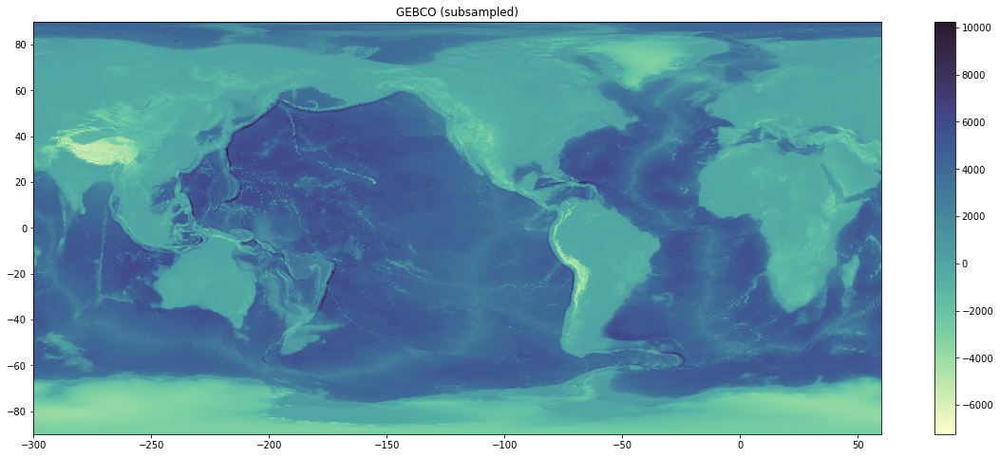

In [4]:
# GEBCO-2020 + Bedmachine combined topography 

fname_gebco  = "/archive/gold/datasets/topography/GEBCO_2023/GEBCO_2023.nc"

GEBCO = GEBCO_data(fname_gebco)

plt.figure(figsize=(20,8))
plt.pcolormesh(GEBCO.lonq[::100], GEBCO.latq[::100], GEBCO.depth[::100,::100], cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('GEBCO (subsampled)');

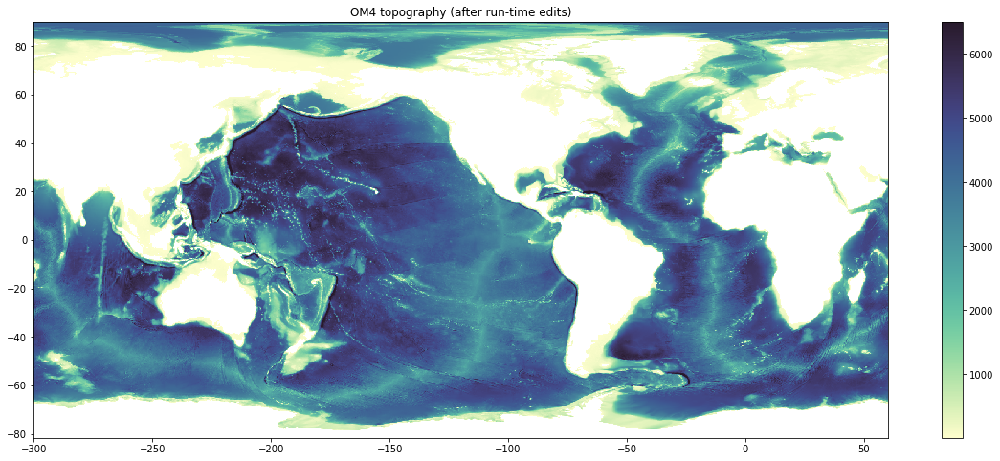

In [5]:
OM4 = OM4_data('/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_hgrid.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_static.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_mask.nc')
plt.figure(figsize=(20,8))
plt.pcolormesh(OM4.lonq, OM4.latq, OM4.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM4 topography (after run-time edits)');

OM5 longitudes are inconsistent!
OM5 latitudes are inconsistent!


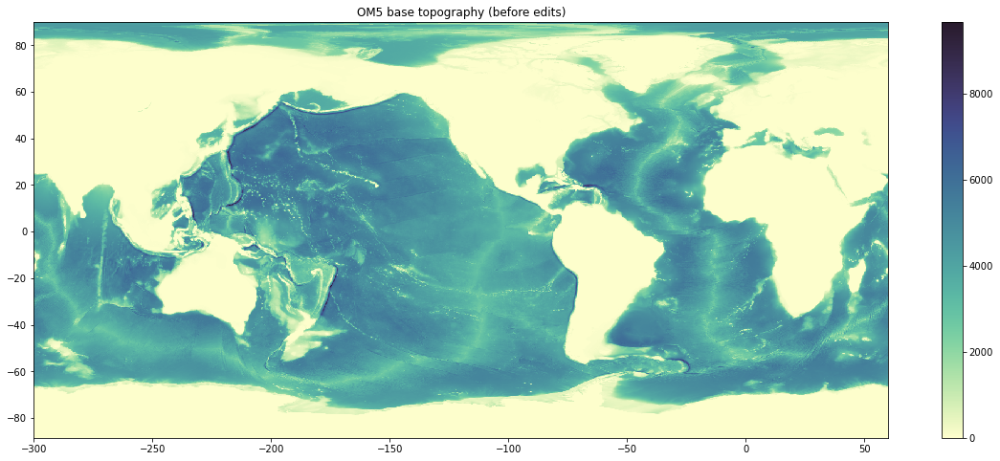

In [6]:
OM5 = OM5_data('/archive/jpk/OM5/OM5_025/prototypes/v20231109/tile_files/ocean_hgrid.nc',
               '/archive/jpk/OM5/OM5_025/prototypes/v20231109/tile_files/ocean_topog_merged.nc')

plt.figure(figsize=(20,8))
plt.pcolormesh(OM5.lonq, OM5.latq, OM5.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM5 base topography (before edits)');

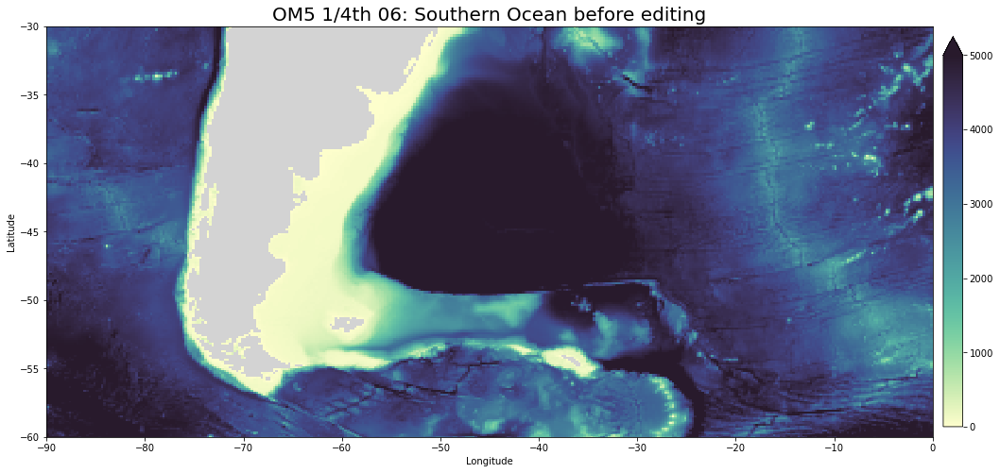

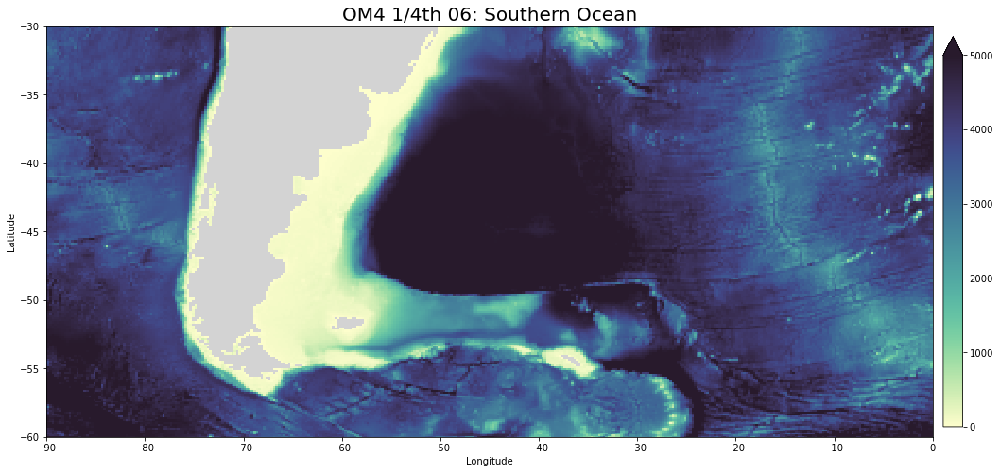

In [7]:
# Broad view of region before edits 

broadview(OM4,OM5,
          (Region_Boundaries[2],Region_Boundaries[3]),
          (Region_Boundaries[0],Region_Boundaries[1]),
          0, 5000, Region_Name, om4=True, new=False)

Gebco (js:je,is:ie) = 7199:9599,50399:52799
OM4 model (js:je,is:ie) = 200:272,838:880
OM5 model (js:je,is:ie) = 281:353,838:880
Using xlim = (-90.0, -80.0) ylim = (-60.0, -50.0)


./tools/topo_tools.py:202: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 9599:11999,50399:52799
OM4 model (js:je,is:ie) = 270:329,838:880
OM5 model (js:je,is:ie) = 351:410,838:880
Using xlim = (-90.0, -80.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,50399:52799
OM4 model (js:je,is:ie) = 327:378,838:880
OM5 model (js:je,is:ie) = 408:459,838:880
Using xlim = (-90.0, -80.0) ylim = (-40.0, -30.0)


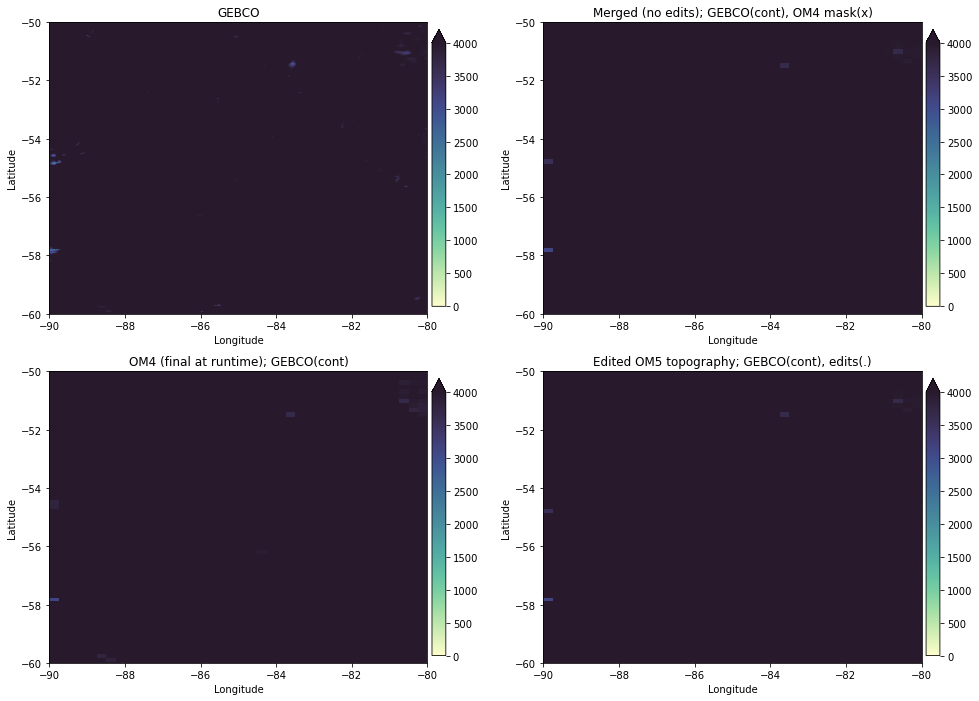

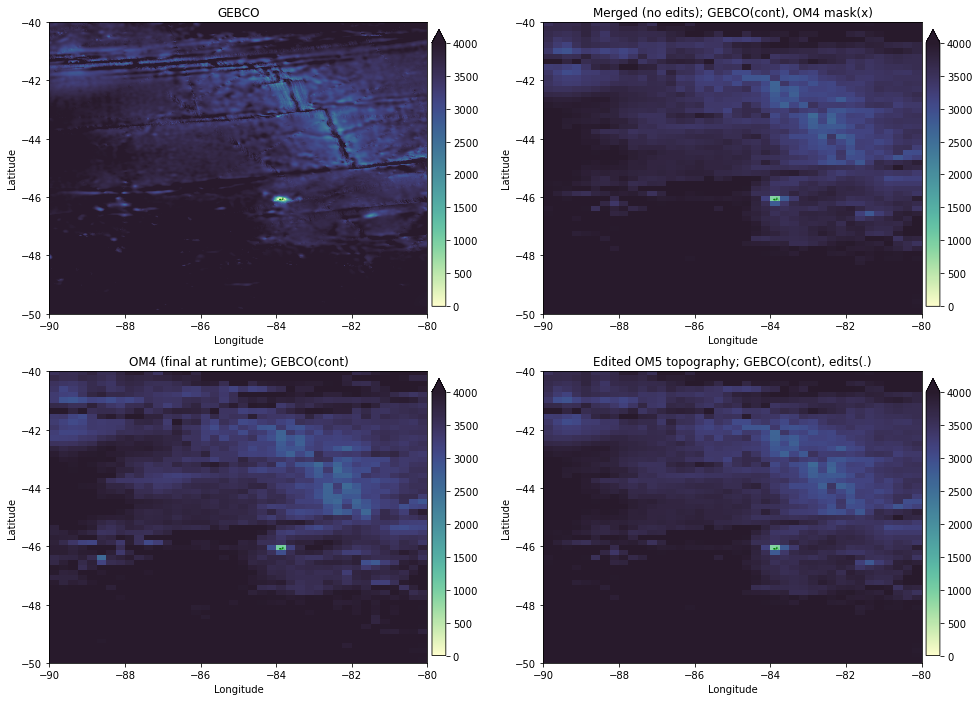

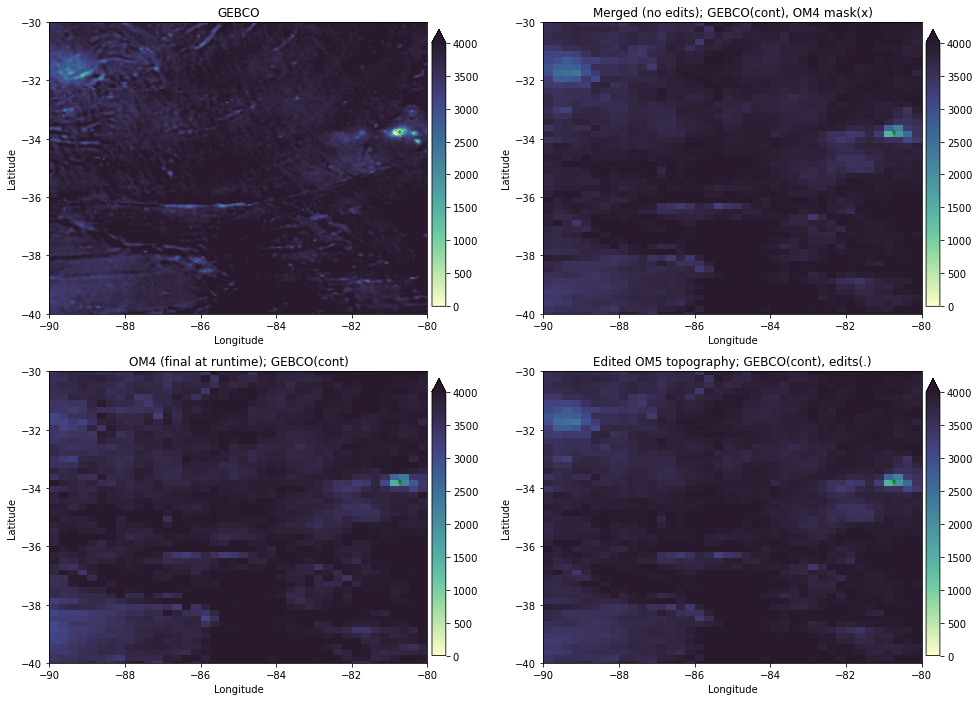

In [8]:
region = Region(-85, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-85, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-85, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,52799:55199
OM4 model (js:je,is:ie) = 200:272,878:920
OM5 model (js:je,is:ie) = 281:353,878:920
Using xlim = (-80.0, -70.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,52799:55199
OM4 model (js:je,is:ie) = 270:329,878:920
OM5 model (js:je,is:ie) = 351:410,878:920
Using xlim = (-80.0, -70.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,52799:55199
OM4 model (js:je,is:ie) = 327:378,878:920
OM5 model (js:je,is:ie) = 408:459,878:920
Using xlim = (-80.0, -70.0) ylim = (-40.0, -30.0)


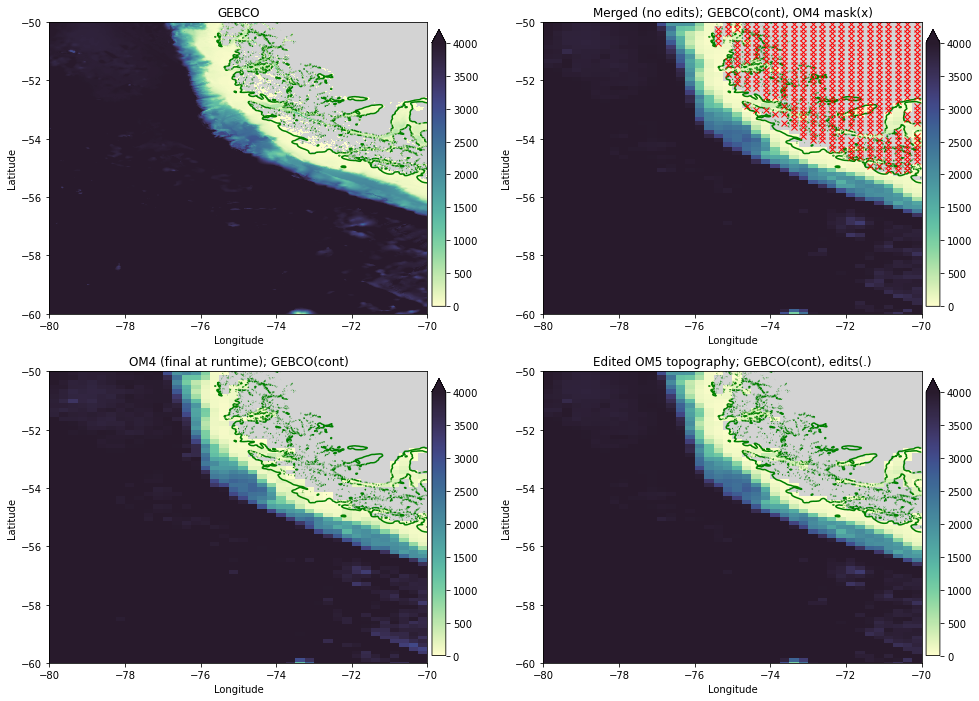

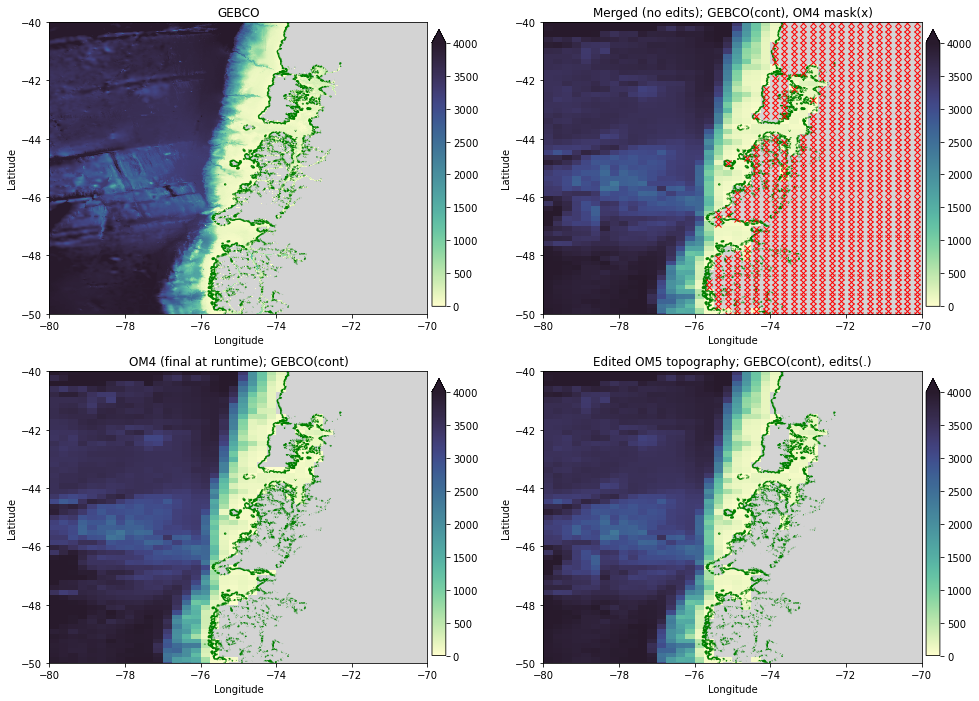

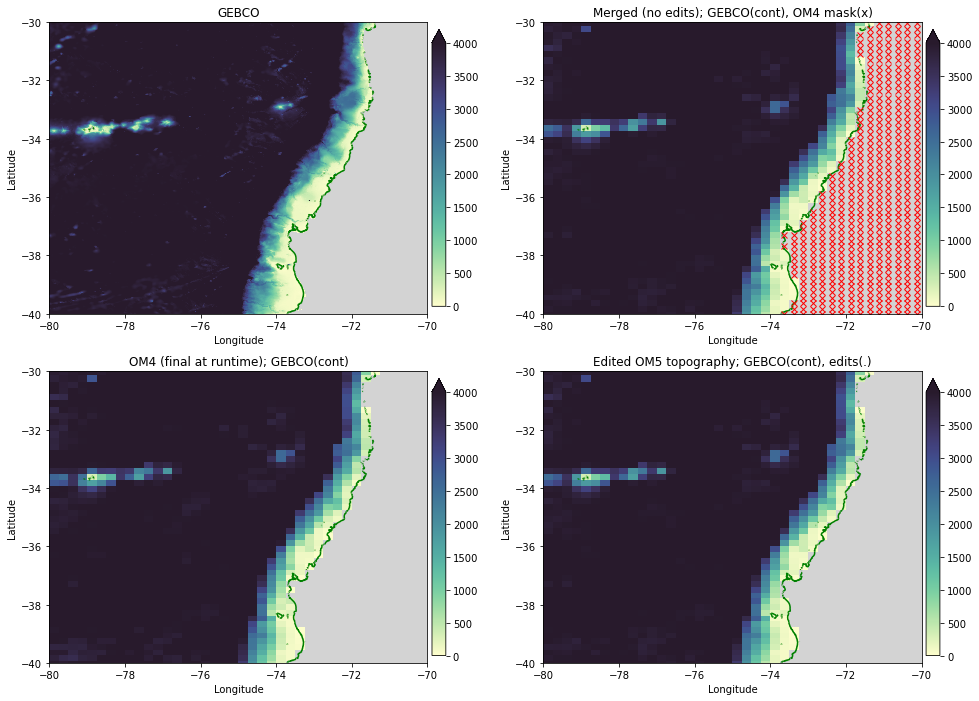

In [9]:
region = Region(-75, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#Proposed edits to fully open Strait of Magellan

region = Region(-75, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits proposed

region = Region(-75, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits proposed

Gebco (js:je,is:ie) = 9359:9839,53759:54239
OM4 model (js:je,is:ie) = 264:279,894:904
OM5 model (js:je,is:ie) = 345:360,894:904
Using xlim = (-76.0, -74.0) ylim = (-51.0, -49.0)


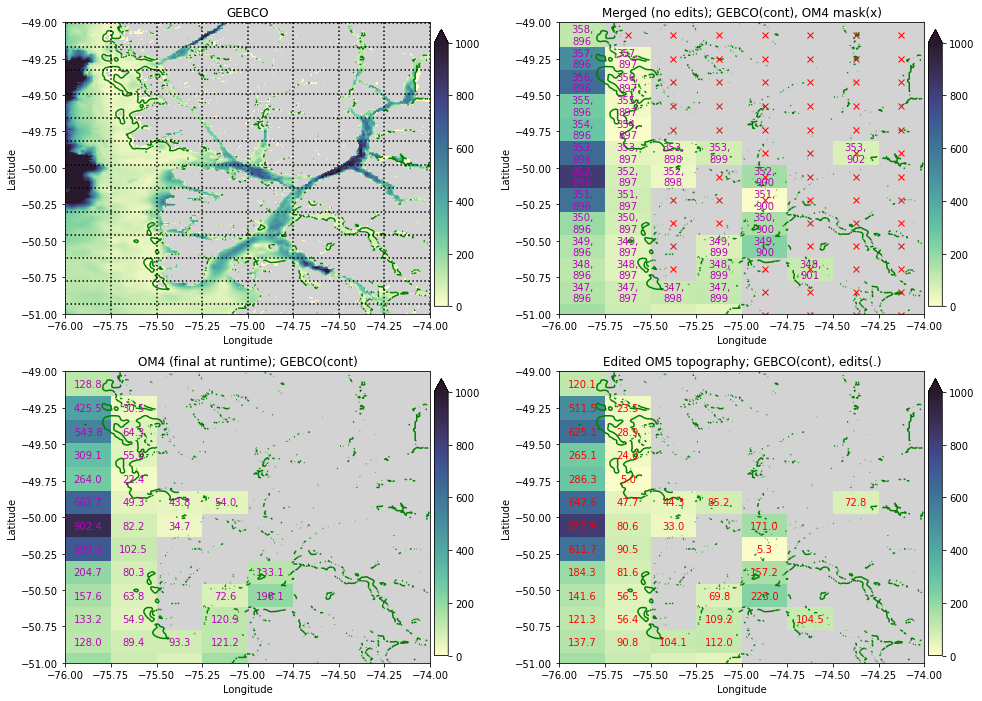

In [10]:
# We could carve out channel around Isla Duque de York?
# will leave it out for now

region = Region(-75, -50, width_lon=2, width_lat=2)

# OM5.depth[348,899]=200
# OM5.depth[349,899]=200
# OM5.depth[350,900]=200
# OM5.depth[351,900]=200
# OM5.depth[352,898]=200
# OM5.depth[352,899]=500
# OM5.depth[352,900]=500
# OM5.depth[352,901]=600
# OM5.depth[352,902]=600
# OM5.depth[353,902]=600

map_region(region, 0, 1000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

Gebco (js:je,is:ie) = 8879:9359,53879:54359
OM4 model (js:je,is:ie) = 251:266,896:906
OM5 model (js:je,is:ie) = 332:347,896:906
Using xlim = (-75.5, -73.5) ylim = (-53.0, -51.0)


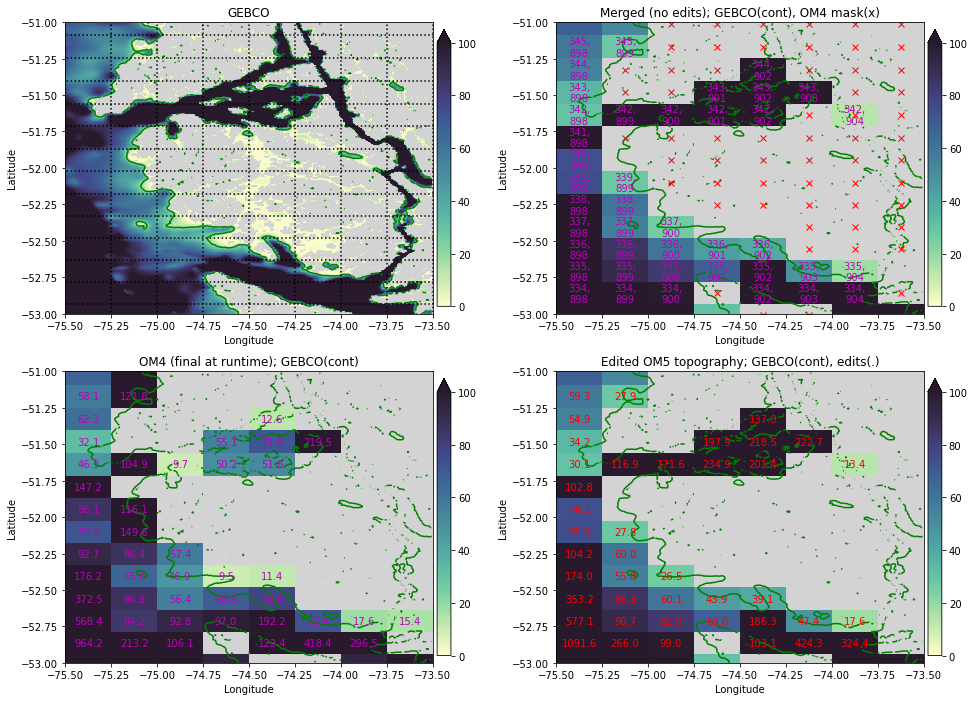

In [11]:
#We could carve out the region south of Isla Jorge Mott?
# Going to leave this out as well
region = Region(-74.5, -52, width_lon=2, width_lat=2)

# OM5.depth[342,898]=70 #Deepening channel so c-grid does not constrict exchange
# OM5.depth[342,899]=250
# OM5.depth[342,900:903]=600
# OM5.depth[343,901:905]=600
# OM5.depth[335,900:902]=100

map_region(region, 0, 100, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

Gebco (js:je,is:ie) = 8399:8879,54239:54719
OM4 model (js:je,is:ie) = 237:253,902:912
OM5 model (js:je,is:ie) = 318:334,902:912
Using xlim = (-74.0, -72.0) ylim = (-55.0, -53.0)


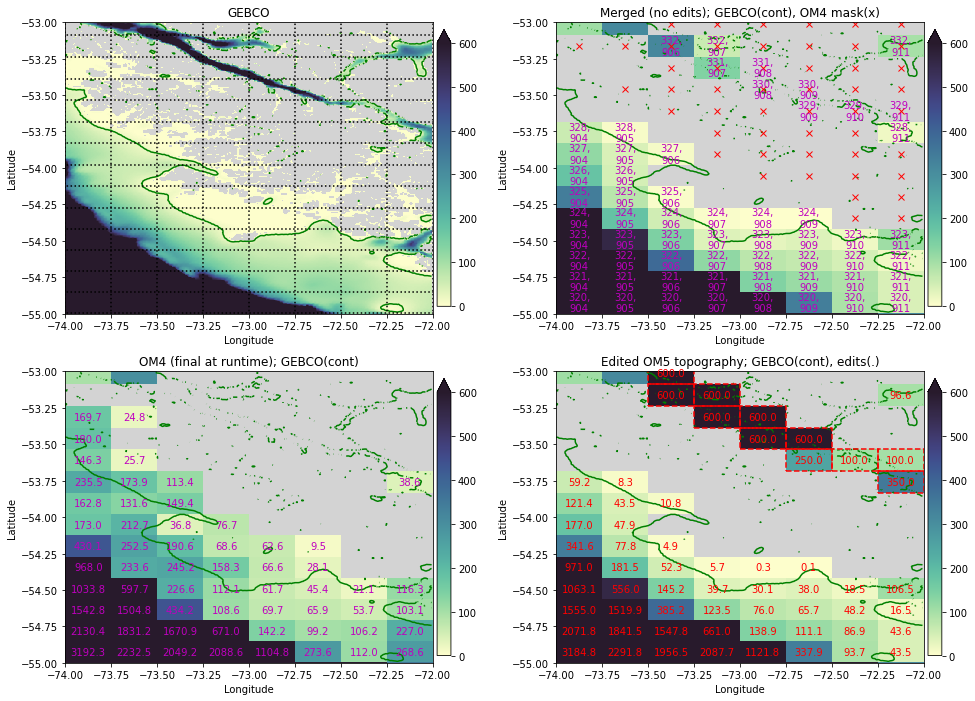

In [12]:
#Opening channels near Strait of Magellan
region = Region(-73, -54, width_lon=2, width_lat=2)

OM5.depth[328,911]=350
OM5.depth[329,909]=250
OM5.depth[329,910]=100
OM5.depth[329,911]=100
OM5.depth[330,908]=600
OM5.depth[330,909]=600
OM5.depth[331,907]=600
OM5.depth[331,908]=600
OM5.depth[332,907]=600
OM5.depth[332,906]=600
OM5.depth[333,906]=600

map_region(region, 0, 600, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

#No edits needed

Gebco (js:je,is:ie) = 8399:8879,54719:55199
OM4 model (js:je,is:ie) = 237:253,910:920
OM5 model (js:je,is:ie) = 318:334,910:920
Using xlim = (-72.0, -70.0) ylim = (-55.0, -53.0)


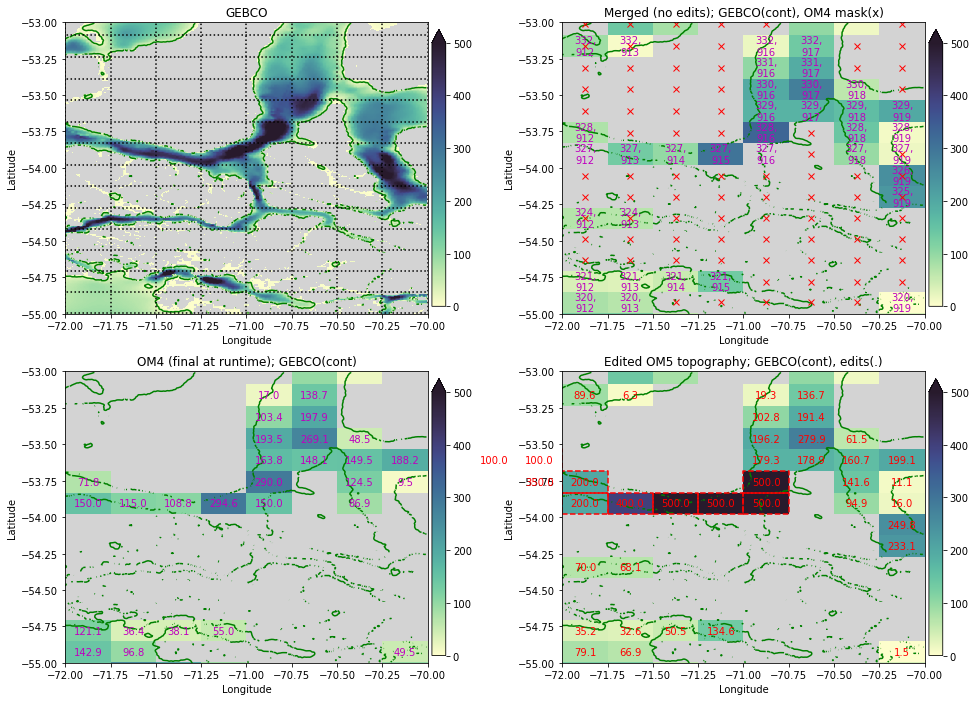

In [13]:
#Opening channels near Strait of Magellan
region = Region(-71, -54, width_lon=2, width_lat=2)

OM5.depth[327,912]=200
OM5.depth[327,913]=400
OM5.depth[327,914]=500
OM5.depth[327,915]=500
OM5.depth[327,916]=500
OM5.depth[328,912]=200
OM5.depth[328,916]=500


map_region(region, 0, 500, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

#No edits needed

Gebco (js:je,is:ie) = 8879:9359,54839:55559
OM4 model (js:je,is:ie) = 251:266,912:926
OM5 model (js:je,is:ie) = 332:347,912:926
Using xlim = (-71.5, -68.5) ylim = (-53.0, -51.0)


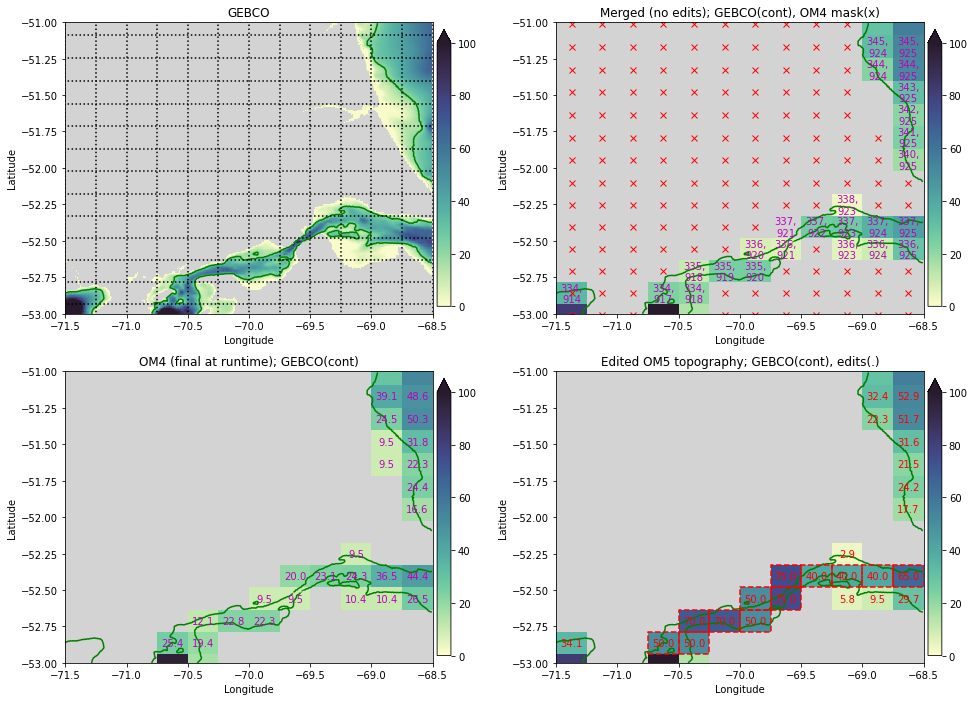

In [14]:
#Opening channels near Strait of Magellan
region = Region(-70, -52, width_lon=3, width_lat=2)

OM5.depth[337,925]=65
OM5.depth[337,924]=40
OM5.depth[337,923]=40
OM5.depth[337,922]=40
OM5.depth[337,921]=75
OM5.depth[336,921]=75
OM5.depth[336,920]=50
OM5.depth[335,920]=50
OM5.depth[335,919]=70
OM5.depth[335,918]=70
OM5.depth[334,918]=50
OM5.depth[334,917]=50

map_region(region, 0, 100, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

#No edits needed

Gebco (js:je,is:ie) = 8879:9359,55319:56039
OM4 model (js:je,is:ie) = 251:266,920:934
OM5 model (js:je,is:ie) = 332:347,920:934
Using xlim = (-69.5, -66.5) ylim = (-53.0, -51.0)


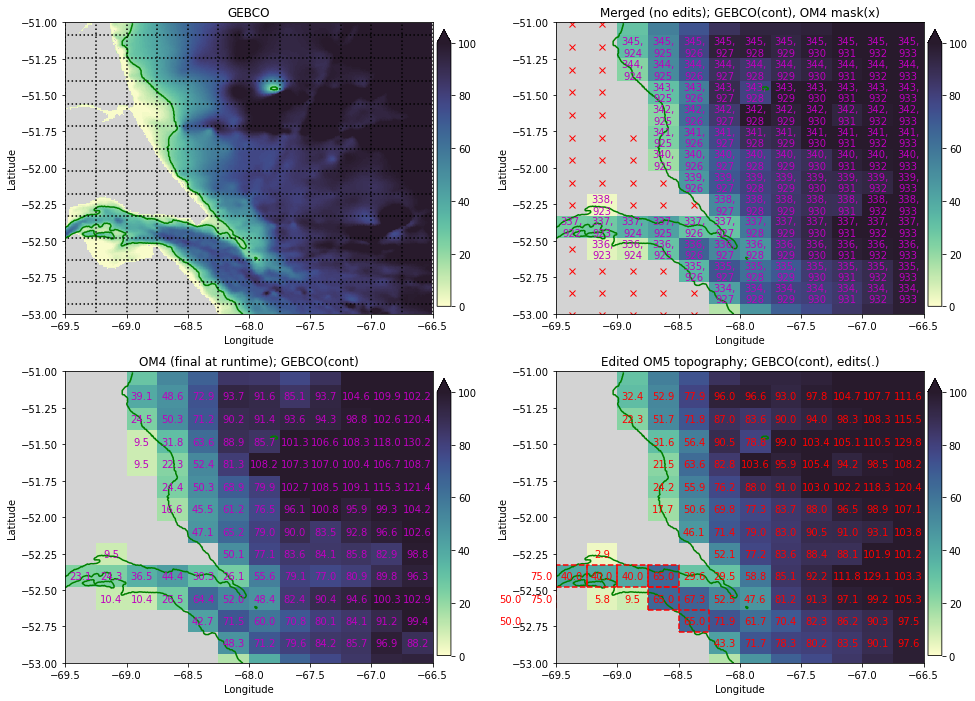

In [15]:
#Opening channels near Strait of Magellan
region = Region(-68, -52, width_lon=3, width_lat=2)

OM5.depth[336,925]=65
OM5.depth[335,926]=65

map_region(region, 0, 100, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

#No edits needed

Gebco (js:je,is:ie) = 8159:8399,54719:55199
OM4 model (js:je,is:ie) = 230:239,910:920
OM5 model (js:je,is:ie) = 311:320,910:920
Using xlim = (-72.0, -70.0) ylim = (-56.0, -55.0)


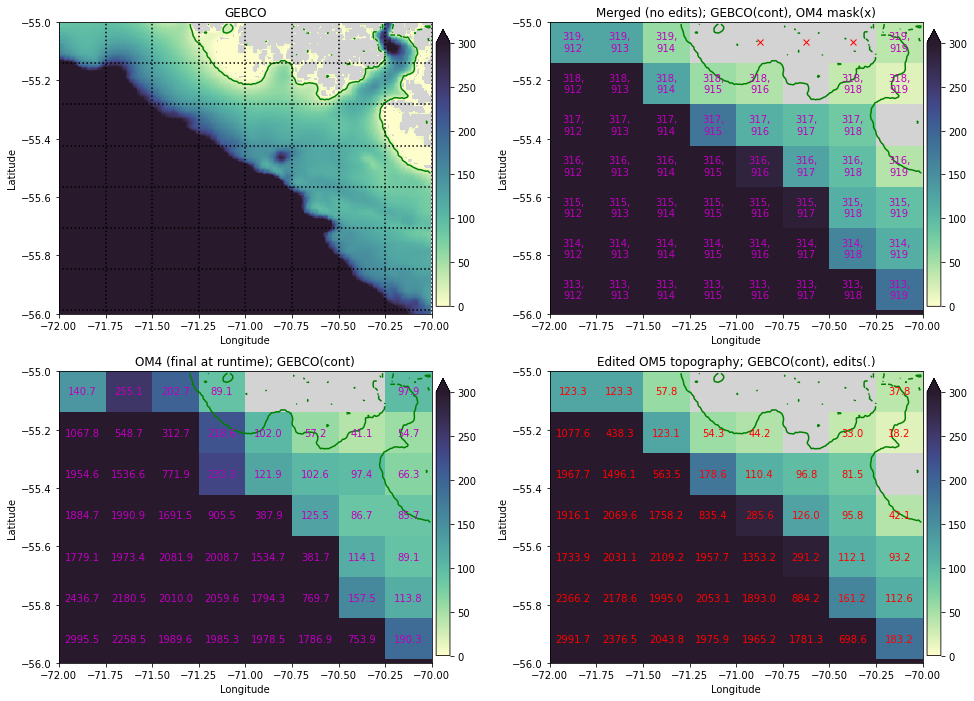

In [16]:
#We could open up this bay, but will leave it for now.
region = Region(-71, -55.5, width_lon=2, width_lat=1)

# OM5.depth[319,919]=300
# OM5.depth[318,919]=175
# OM5.depth[318,918]=150

map_region(region, 0, 300, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

#No edits needed

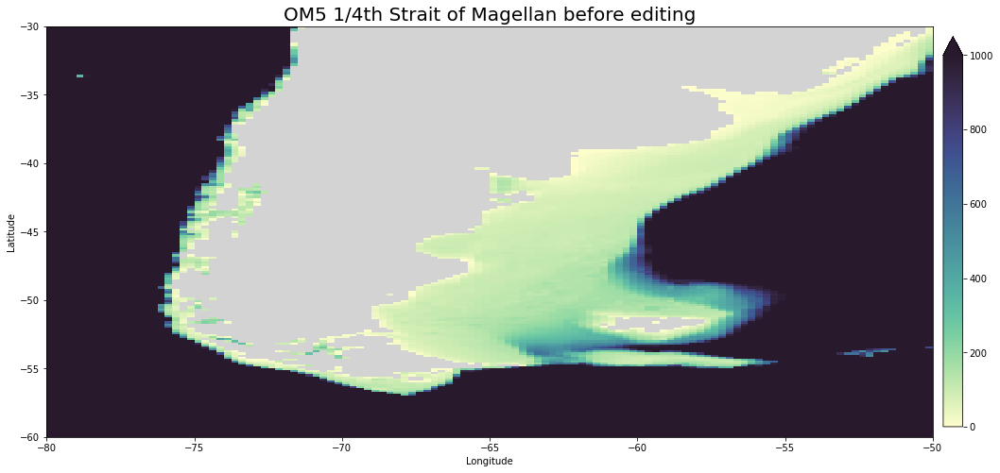

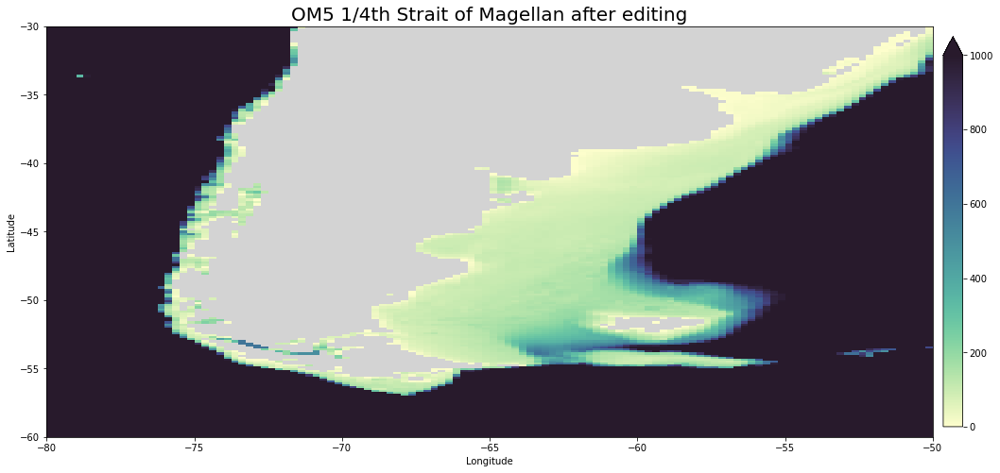

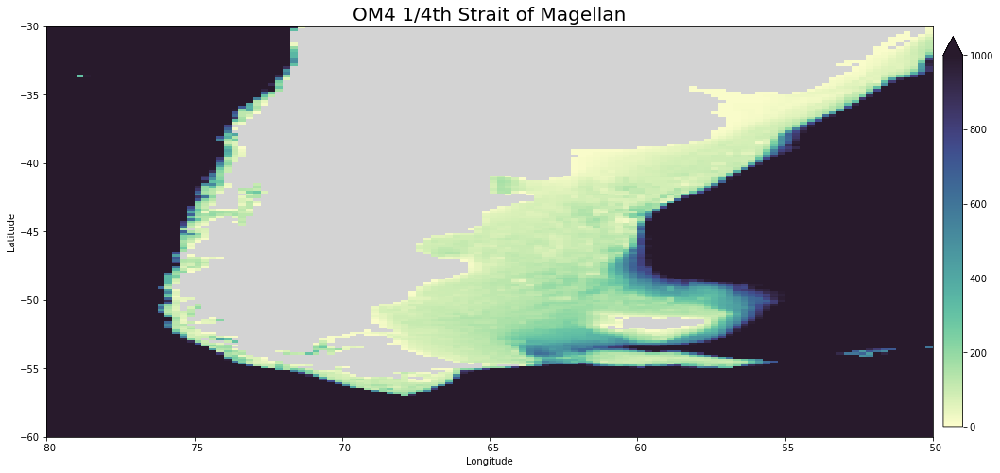

In [17]:
#Display this region after opening Strait of Magellan

broadview(OM4,OM5,
          (-80,-50), (-60,-30), 0, 1000, "Strait of Magellan", om4=True, new=True)

Gebco (js:je,is:ie) = 7199:9599,55199:57599
OM4 model (js:je,is:ie) = 200:272,918:960
OM5 model (js:je,is:ie) = 281:353,918:960
Using xlim = (-70.0, -60.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,55199:57599
OM4 model (js:je,is:ie) = 270:329,918:960
OM5 model (js:je,is:ie) = 351:410,918:960
Using xlim = (-70.0, -60.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,55199:57599
OM4 model (js:je,is:ie) = 327:378,918:960
OM5 model (js:je,is:ie) = 408:459,918:960
Using xlim = (-70.0, -60.0) ylim = (-40.0, -30.0)


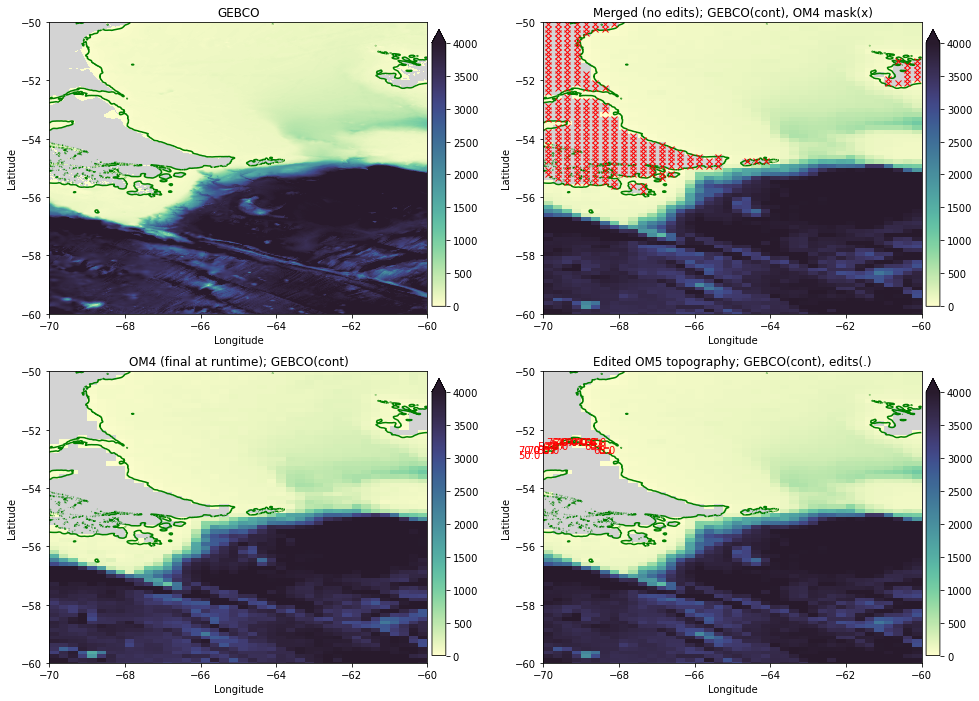

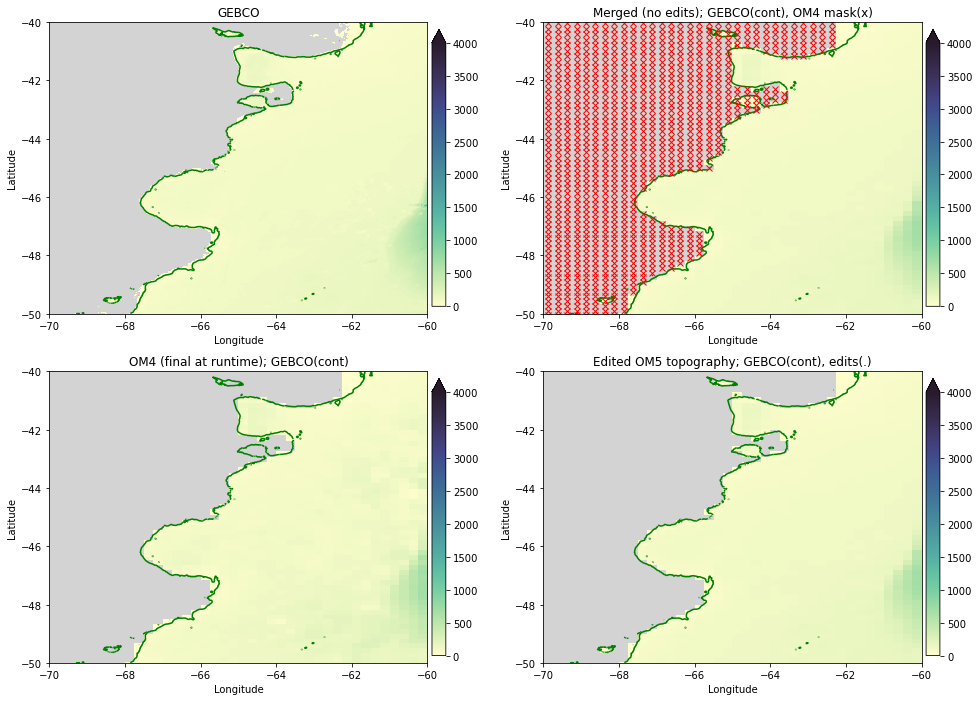

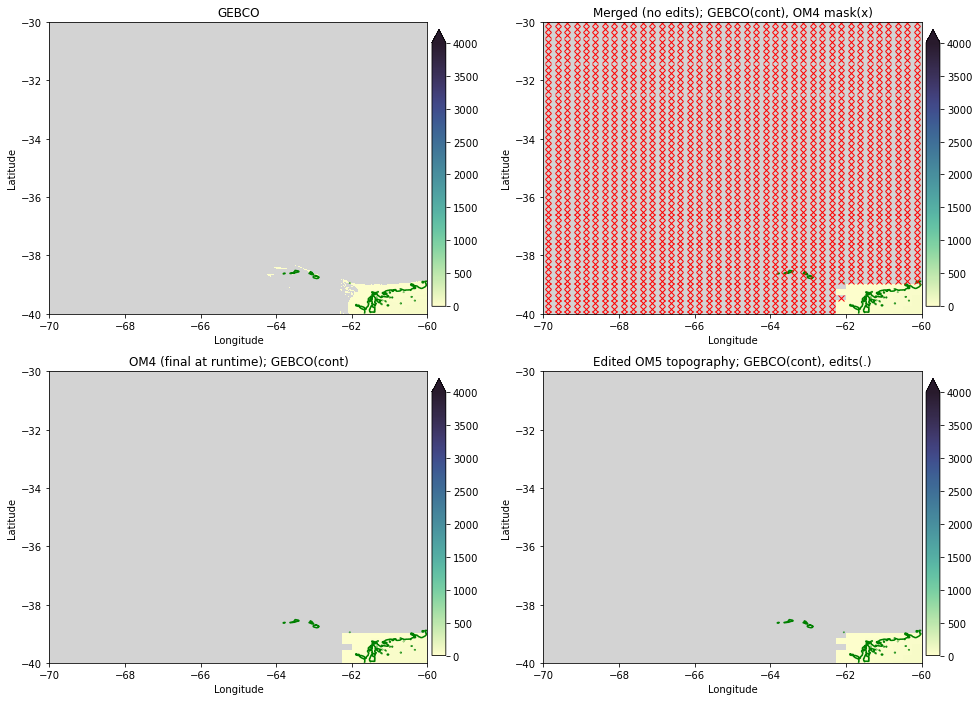

In [18]:
region = Region(-65, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-65, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed (we could open Golfo Neuvo but will leave it for now)

region = Region(-65, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 11039:11759,56039:56759
OM4 model (js:je,is:ie) = 306:324,932:946
OM5 model (js:je,is:ie) = 387:405,932:946
Using xlim = (-66.5, -63.5) ylim = (-44.0, -41.0)


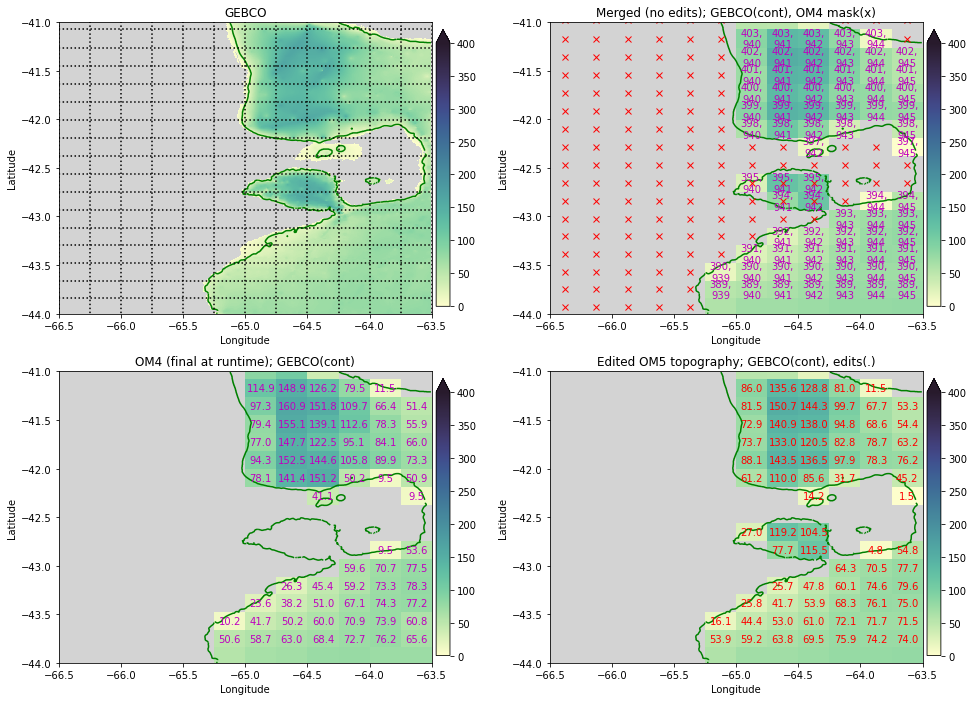

In [19]:
# We could open up Gulfo Nuevo?

region = Region(-65, -42.5, width_lon=3, width_lat=3)
#OM5.depth[393,942]=47.8
map_region(region, 0, 400, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);



Gebco (js:je,is:ie) = 7199:9599,57599:59999
OM4 model (js:je,is:ie) = 200:272,958:1000
OM5 model (js:je,is:ie) = 281:353,958:1000
Using xlim = (-60.0, -50.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,57599:59999
OM4 model (js:je,is:ie) = 270:329,958:1000
OM5 model (js:je,is:ie) = 351:410,958:1000
Using xlim = (-60.0, -50.0) ylim = (-50.0, -40.0)


./tools/topo_tools.py:202: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 11999:14399,57599:59999
OM4 model (js:je,is:ie) = 327:378,958:1000
OM5 model (js:je,is:ie) = 408:459,958:1000
Using xlim = (-60.0, -50.0) ylim = (-40.0, -30.0)


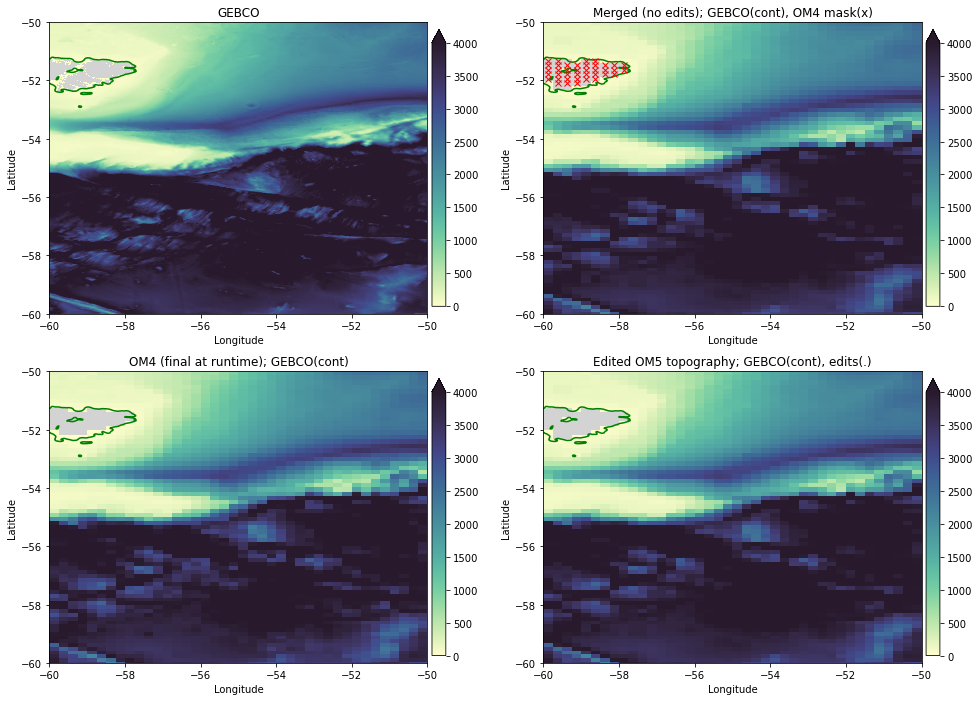

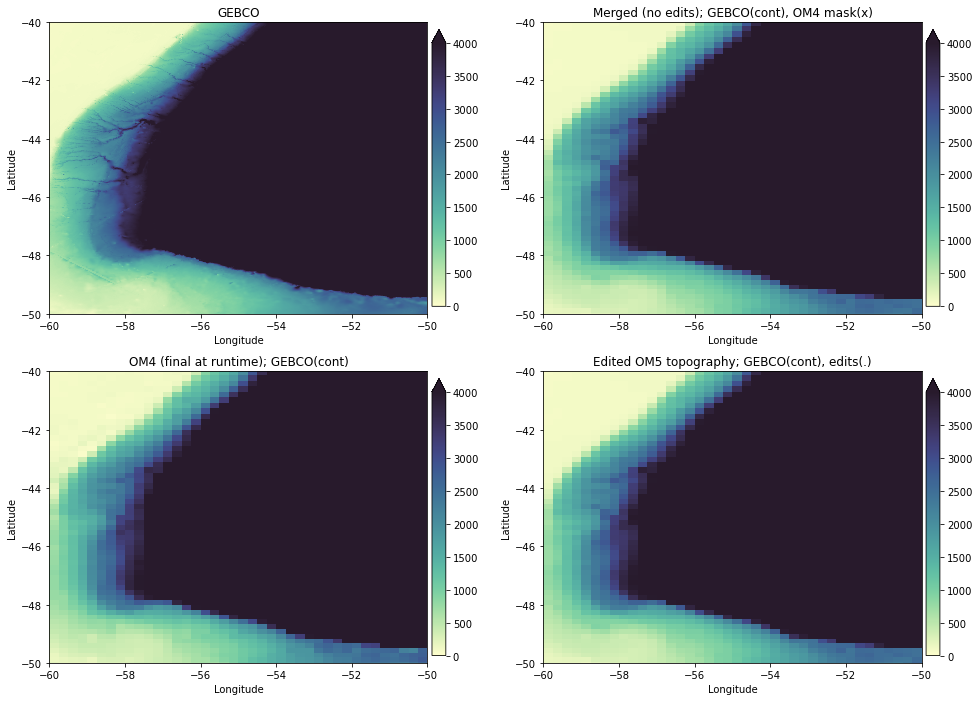

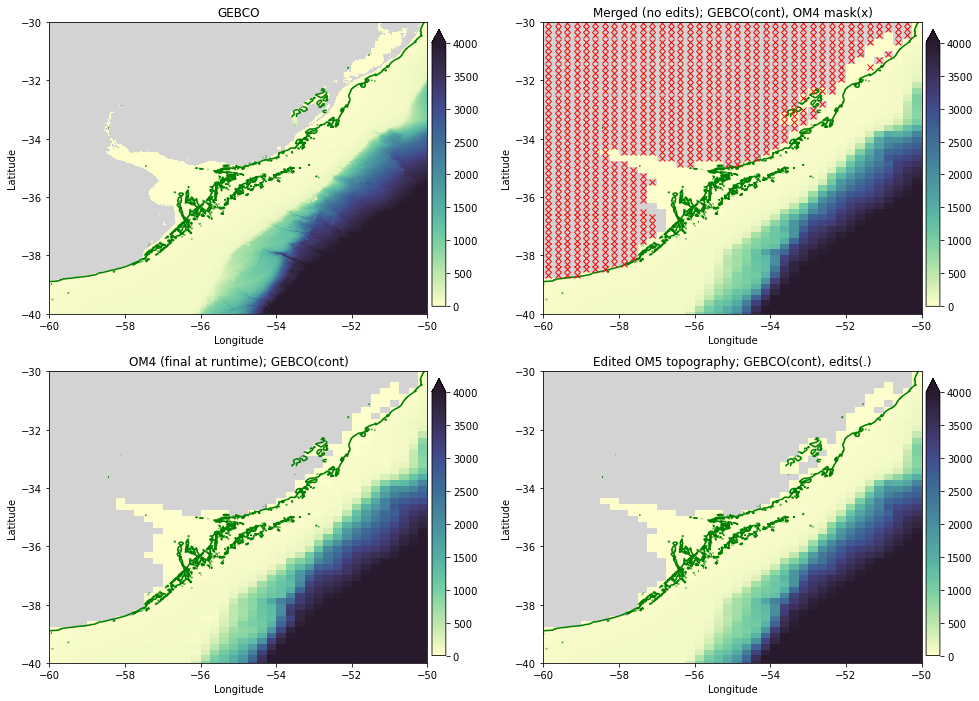

In [20]:
region = Region(-55, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-55, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-55, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#Closing one point near Buenos Aires that was closed in OM4 and is extremely shallow

Gebco (js:je,is:ie) = 8879:9359,57599:58079
OM4 model (js:je,is:ie) = 251:266,958:968
OM5 model (js:je,is:ie) = 332:347,958:968
Using xlim = (-60.0, -58.0) ylim = (-53.0, -51.0)


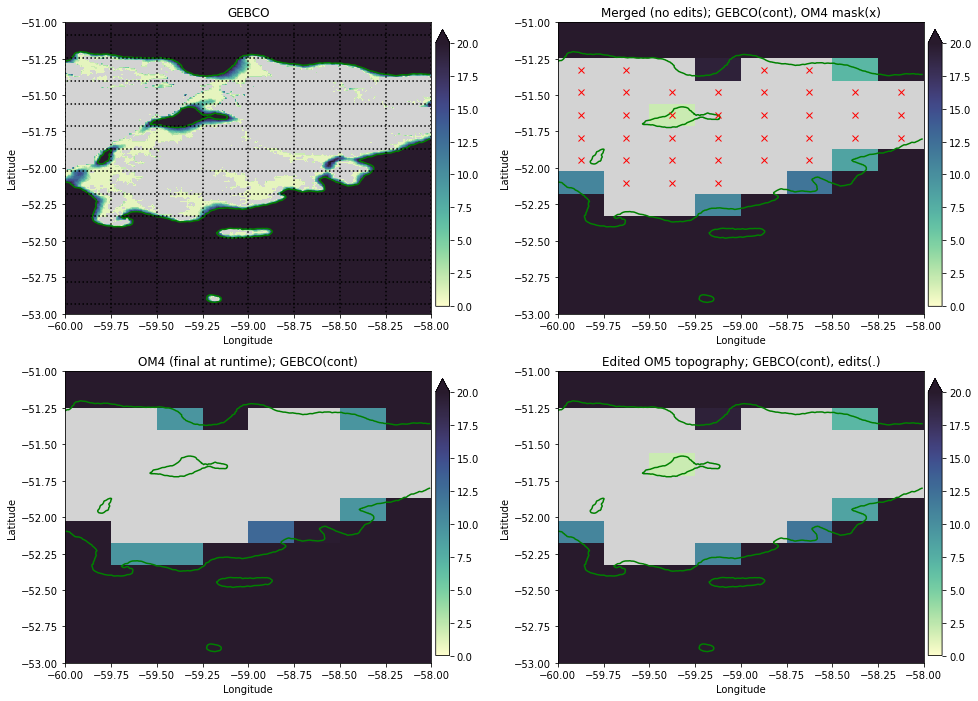

In [21]:
#Falkland Islands - Leaving as one island since the channel is very shallow.

region = Region(-59, -52, width_lon=2, width_lat=2)
map_region(region, 0, 20, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);


Gebco (js:je,is:ie) = 12719:13439,57839:58559
OM4 model (js:je,is:ie) = 342:359,962:976
OM5 model (js:je,is:ie) = 423:440,962:976
Using xlim = (-59.0, -56.0) ylim = (-37.0, -34.0)


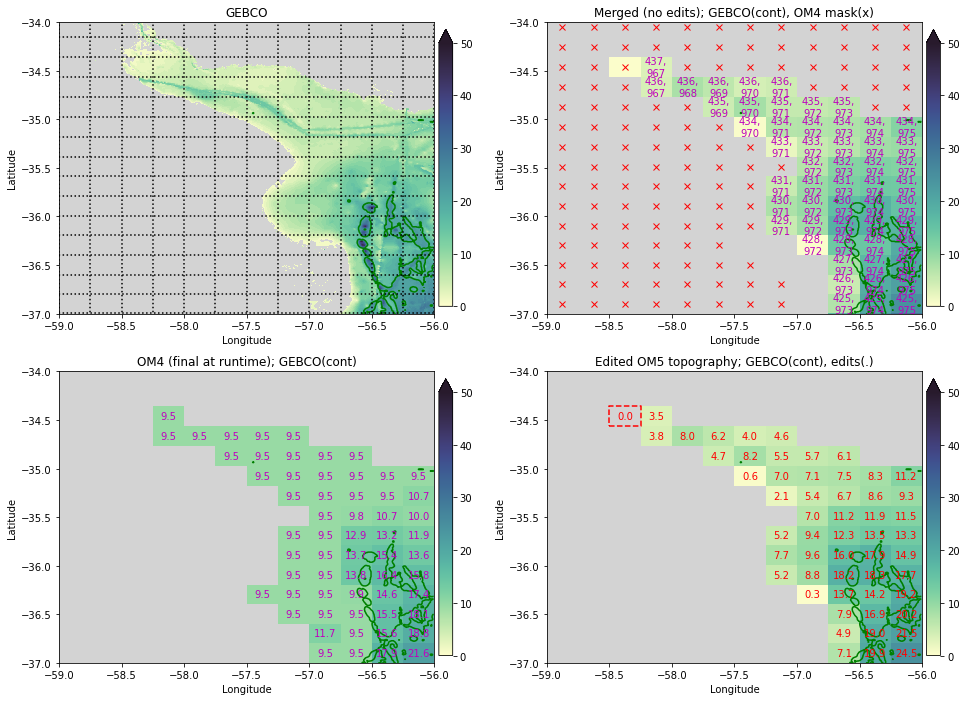

In [22]:
#Buenos Aires
region = Region(-57.5, -35.5, width_lon=3, width_lat=3)
OM5.depth[437,966]=0 #Removing since very shallow
map_region(region, 0, 50, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);


Gebco (js:je,is:ie) = 7199:9599,59999:62399
OM4 model (js:je,is:ie) = 200:272,998:1040
OM5 model (js:je,is:ie) = 281:353,998:1040
Using xlim = (-50.0, -40.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,59999:62399
OM4 model (js:je,is:ie) = 270:329,998:1040
OM5 model (js:je,is:ie) = 351:410,998:1040
Using xlim = (-50.0, -40.0) ylim = (-50.0, -40.0)


./tools/topo_tools.py:202: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 11999:14399,59999:62399
OM4 model (js:je,is:ie) = 327:378,998:1040
OM5 model (js:je,is:ie) = 408:459,998:1040
Using xlim = (-50.0, -40.0) ylim = (-40.0, -30.0)


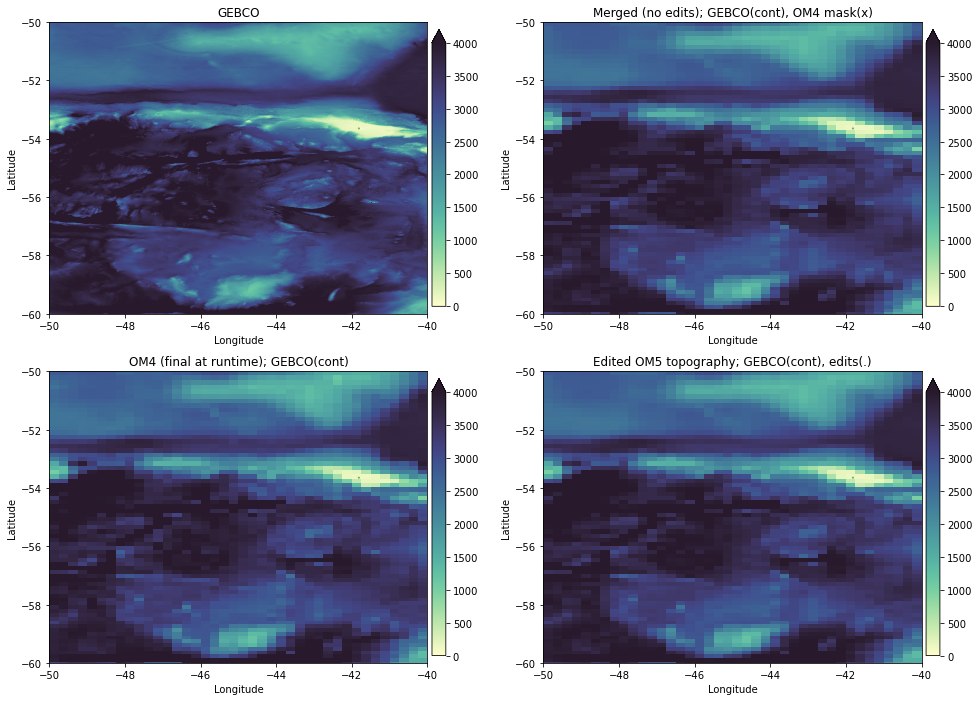

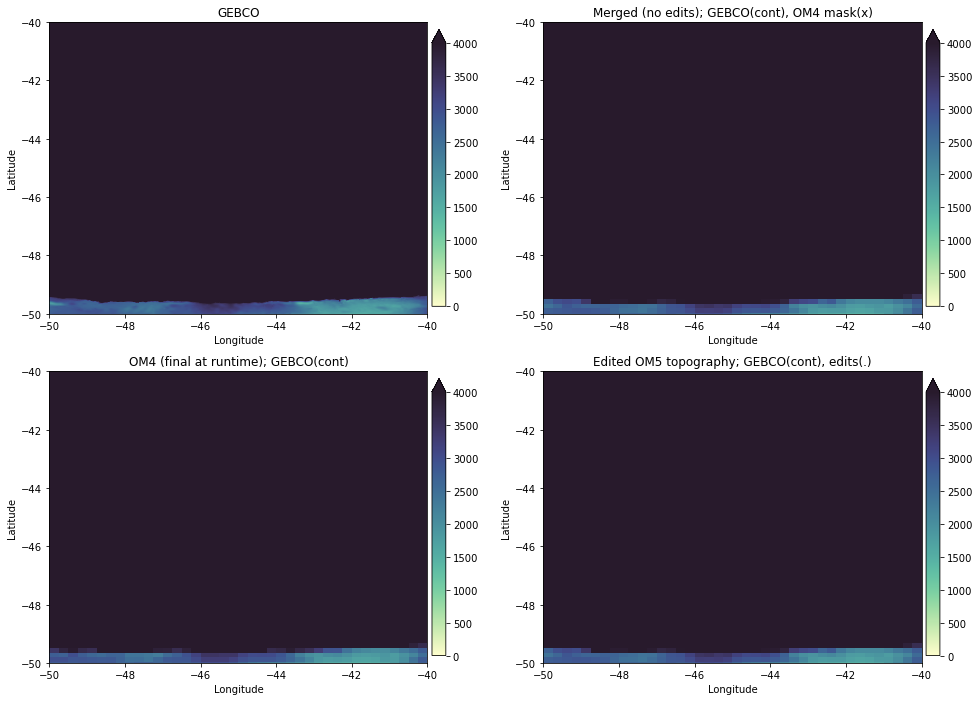

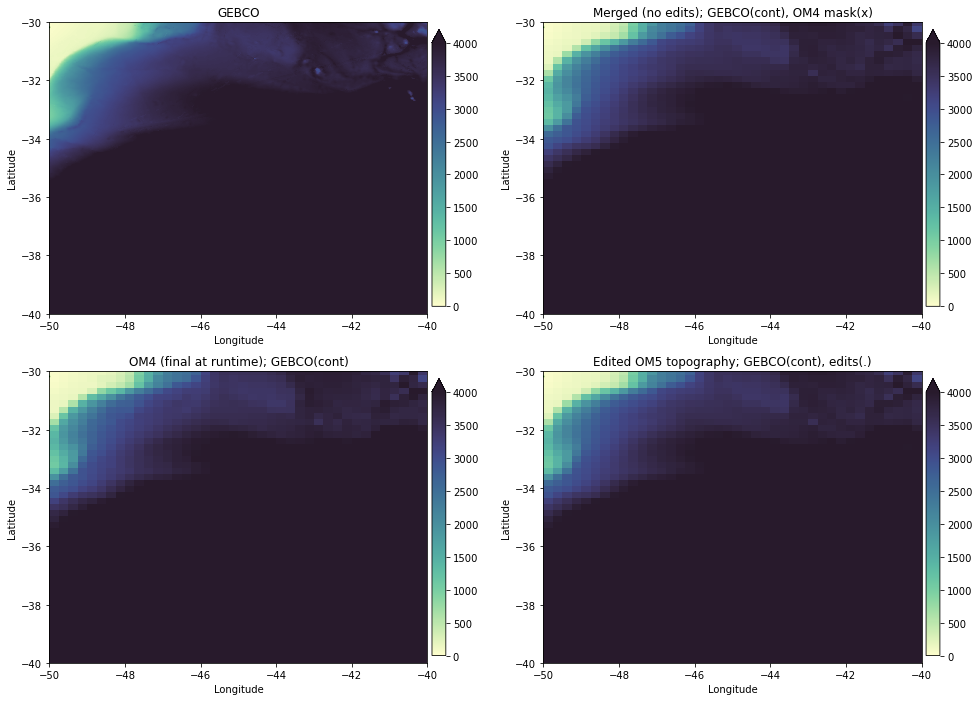

In [23]:
region = Region(-45, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-45, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-45, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,62399:64799
OM4 model (js:je,is:ie) = 200:272,1038:1080
OM5 model (js:je,is:ie) = 281:353,1038:1080
Using xlim = (-40.0, -30.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,62399:64799
OM4 model (js:je,is:ie) = 270:329,1038:1080
OM5 model (js:je,is:ie) = 351:410,1038:1080
Using xlim = (-40.0, -30.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,62399:64799
OM4 model (js:je,is:ie) = 327:378,1038:1080
OM5 model (js:je,is:ie) = 408:459,1038:1080
Using xlim = (-40.0, -30.0) ylim = (-40.0, -30.0)


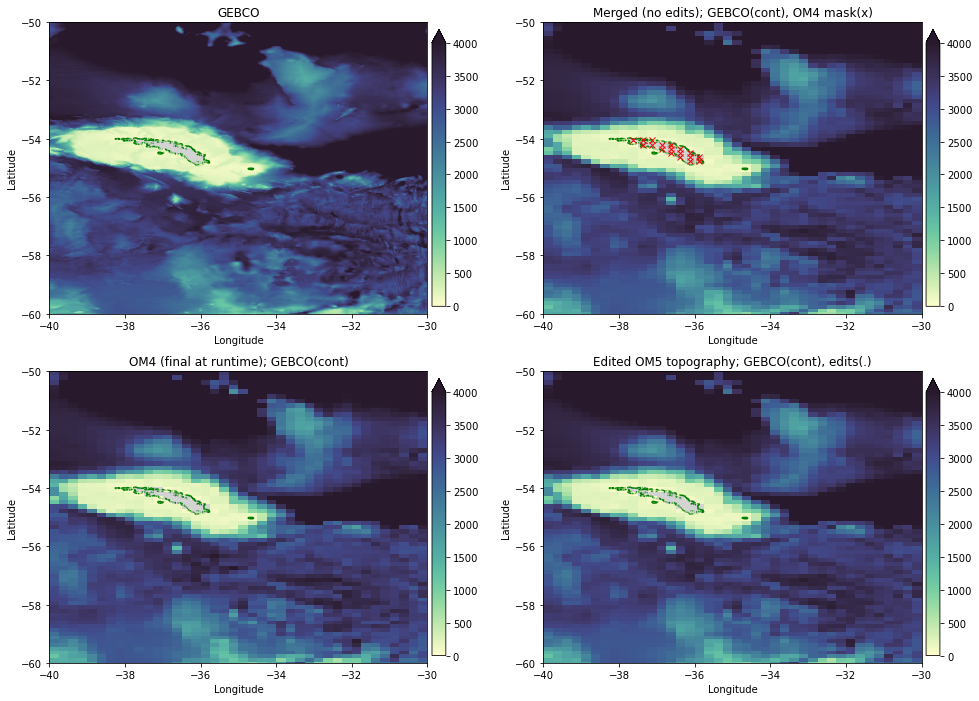

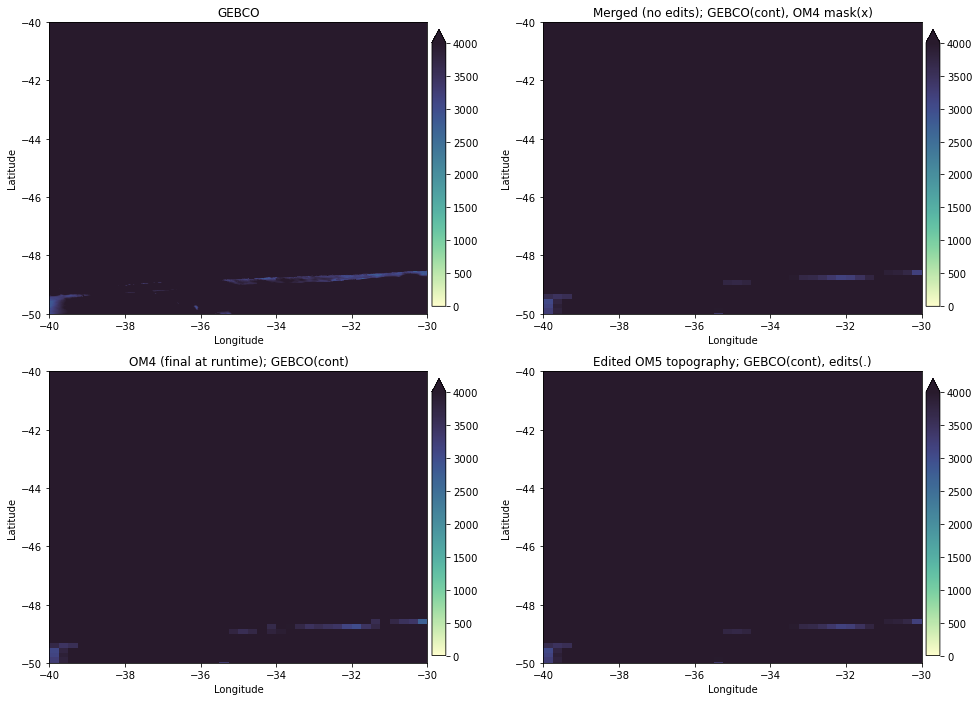

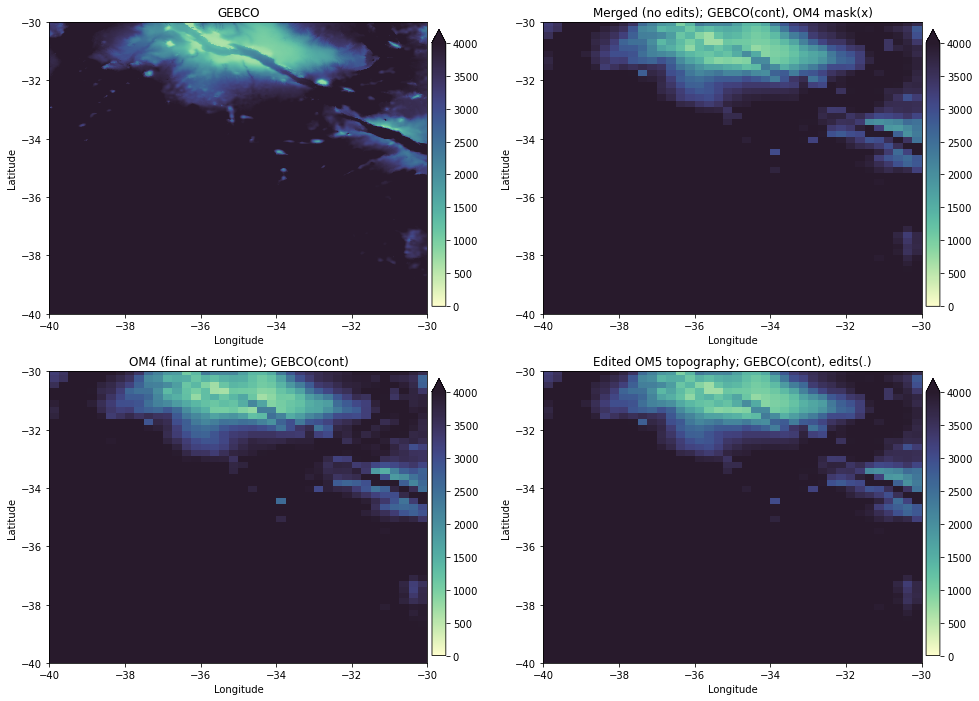

In [24]:
region = Region(-35, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-35, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-35, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,64799:67199
OM4 model (js:je,is:ie) = 200:272,1078:1120
OM5 model (js:je,is:ie) = 281:353,1078:1120
Using xlim = (-30.0, -20.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,64799:67199
OM4 model (js:je,is:ie) = 270:329,1078:1120
OM5 model (js:je,is:ie) = 351:410,1078:1120
Using xlim = (-30.0, -20.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,64799:67199
OM4 model (js:je,is:ie) = 327:378,1078:1120
OM5 model (js:je,is:ie) = 408:459,1078:1120
Using xlim = (-30.0, -20.0) ylim = (-40.0, -30.0)


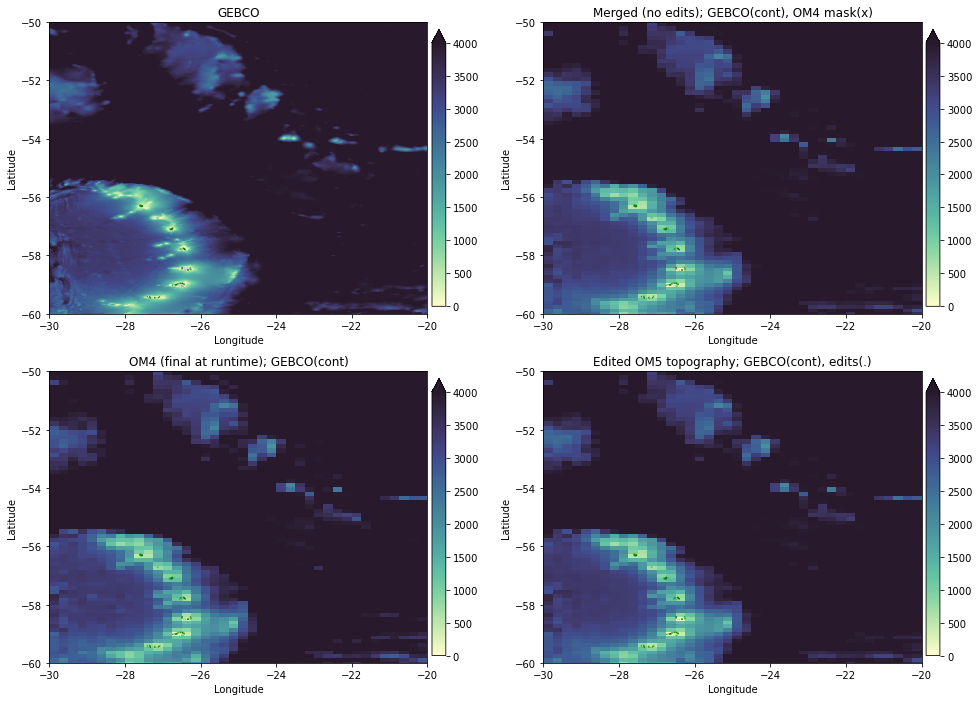

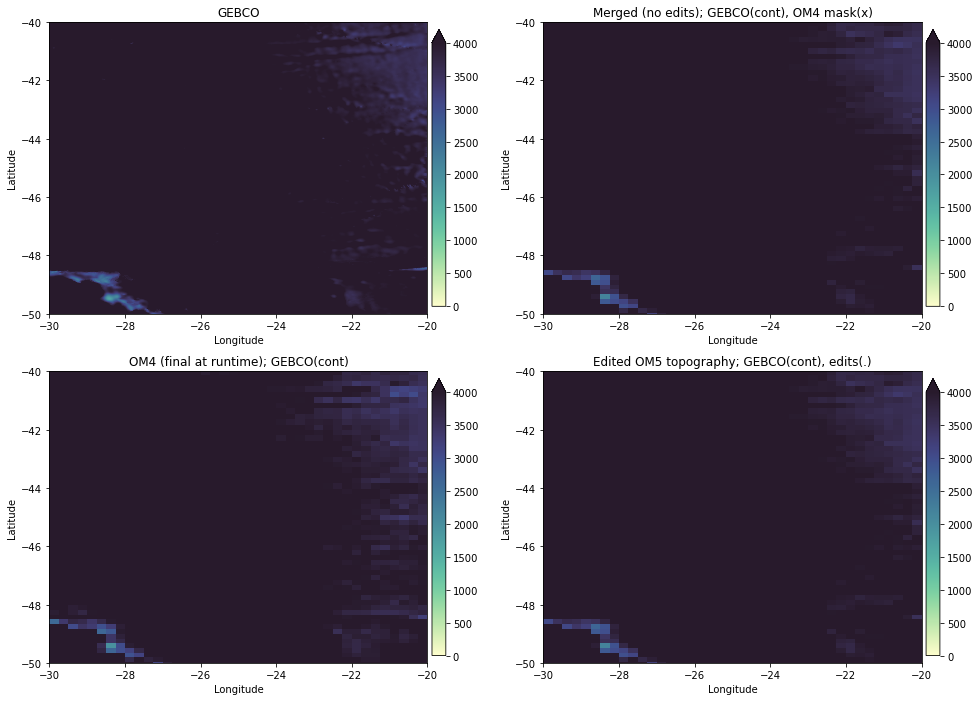

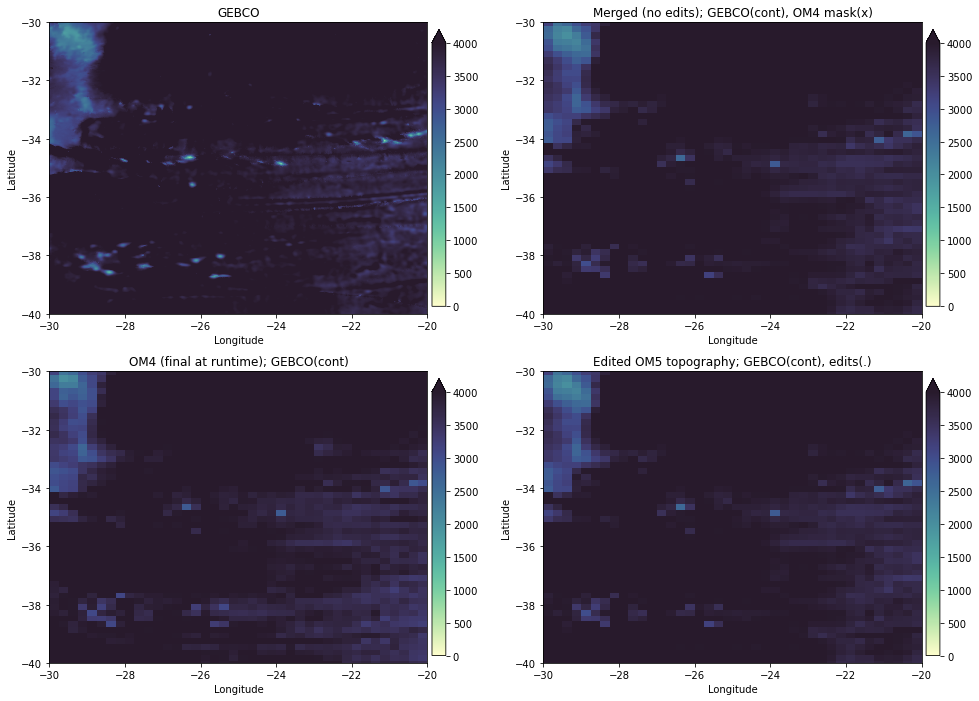

In [25]:
region = Region(-25, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-25, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-25, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,67199:69599
OM4 model (js:je,is:ie) = 200:272,1118:1160
OM5 model (js:je,is:ie) = 281:353,1118:1160
Using xlim = (-20.0, -10.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,67199:69599
OM4 model (js:je,is:ie) = 270:329,1118:1160
OM5 model (js:je,is:ie) = 351:410,1118:1160
Using xlim = (-20.0, -10.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,67199:69599
OM4 model (js:je,is:ie) = 327:378,1118:1160
OM5 model (js:je,is:ie) = 408:459,1118:1160
Using xlim = (-20.0, -10.0) ylim = (-40.0, -30.0)


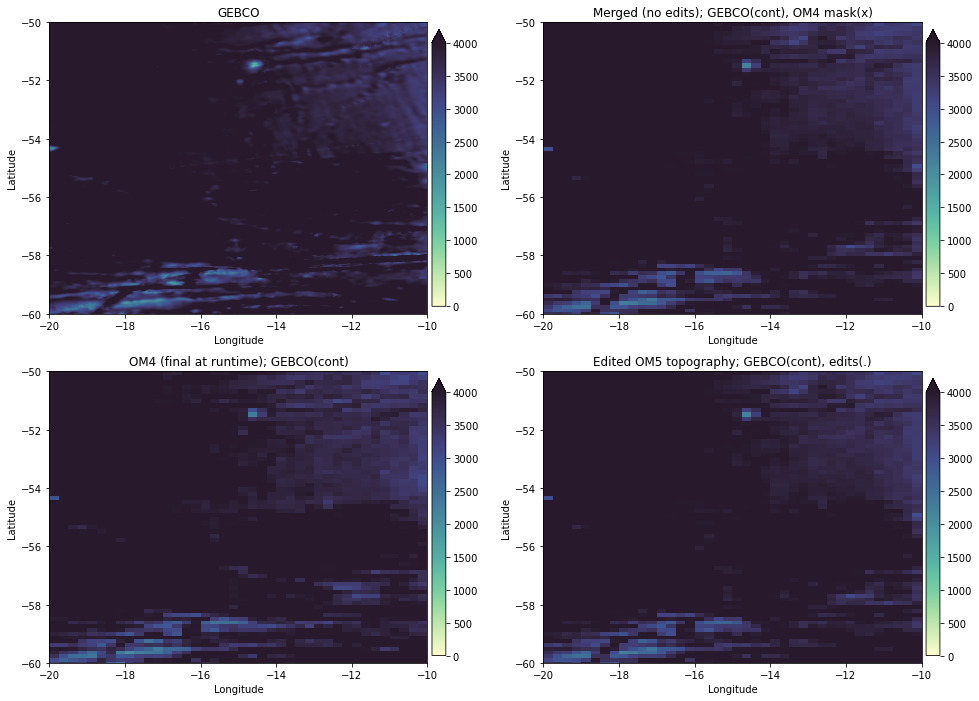

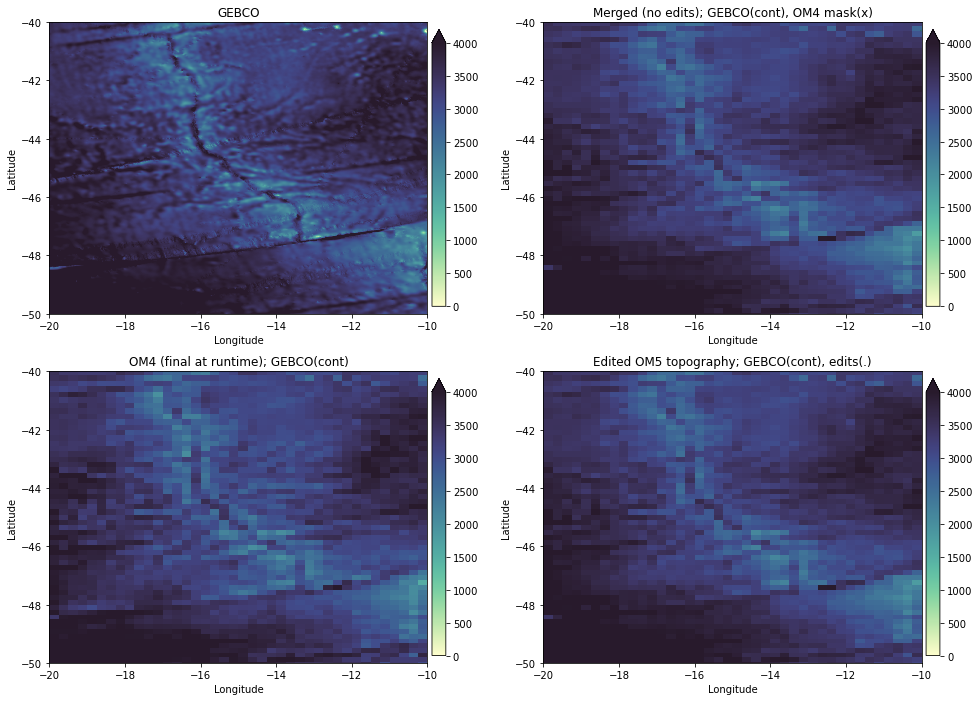

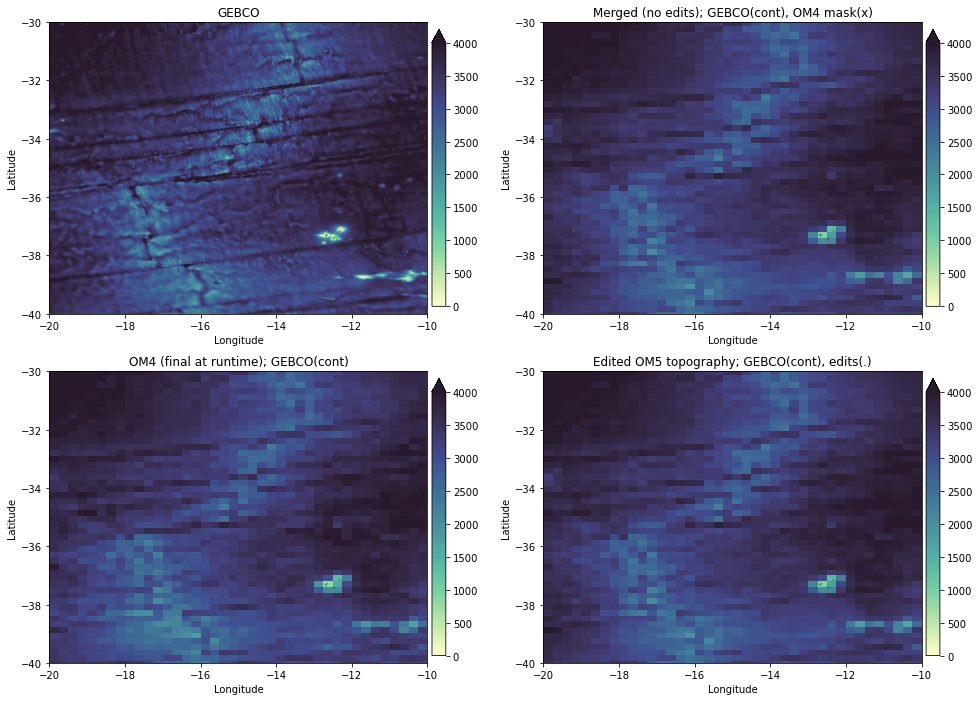

In [26]:
region = Region(-15, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-15, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-15, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,69599:71999
OM4 model (js:je,is:ie) = 200:272,1158:1200
OM5 model (js:je,is:ie) = 281:353,1158:1200
Using xlim = (-10.0, 0.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,69599:71999
OM4 model (js:je,is:ie) = 270:329,1158:1200
OM5 model (js:je,is:ie) = 351:410,1158:1200
Using xlim = (-10.0, 0.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,69599:71999
OM4 model (js:je,is:ie) = 327:378,1158:1200
OM5 model (js:je,is:ie) = 408:459,1158:1200
Using xlim = (-10.0, 0.0) ylim = (-40.0, -30.0)


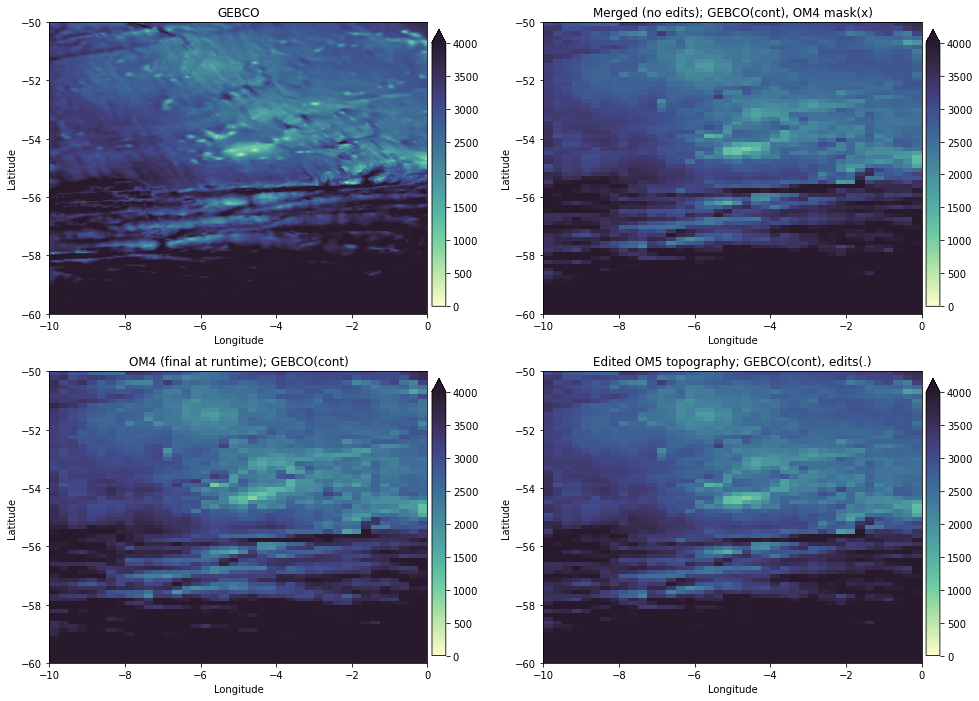

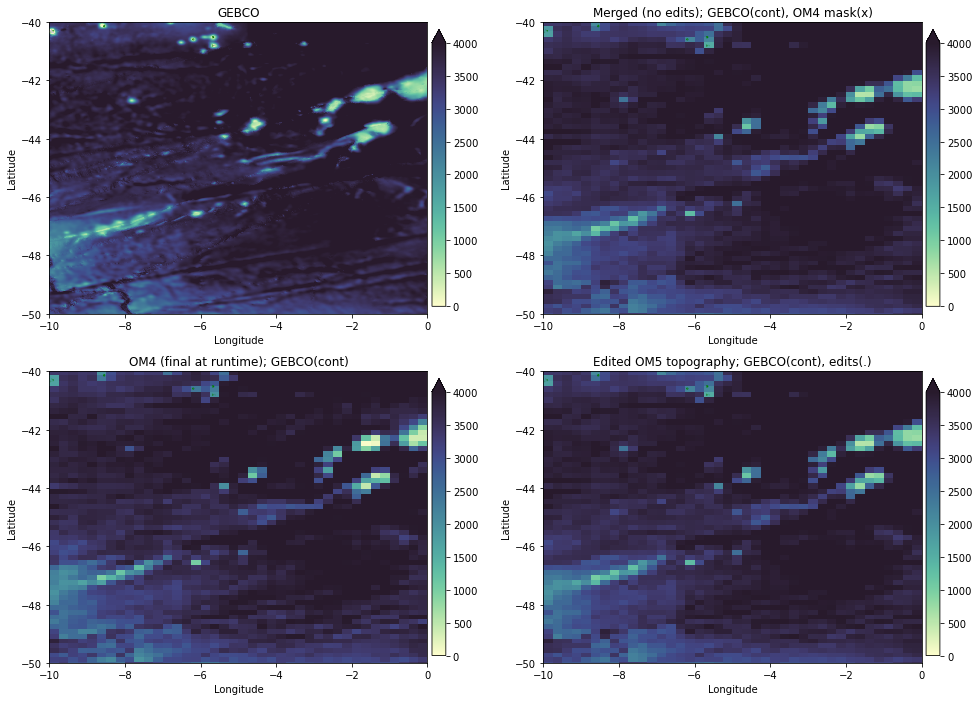

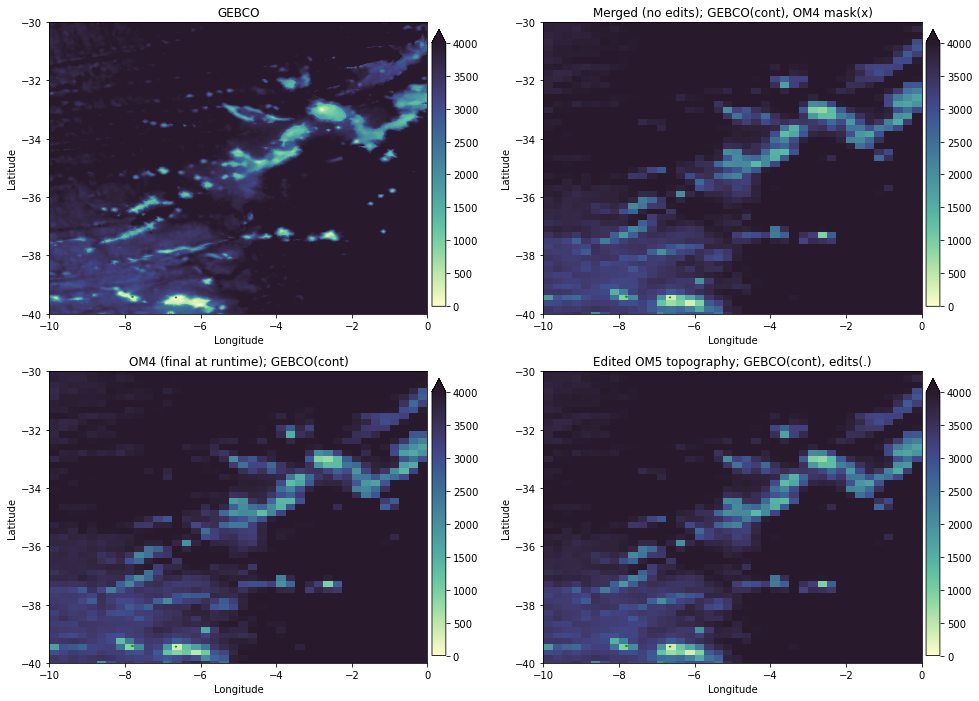

In [27]:
region = Region(-5, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-5, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-5, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

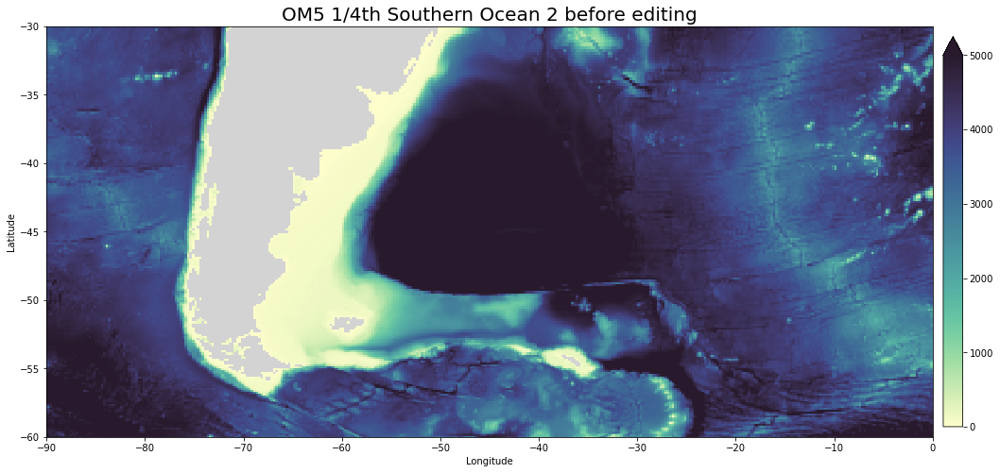

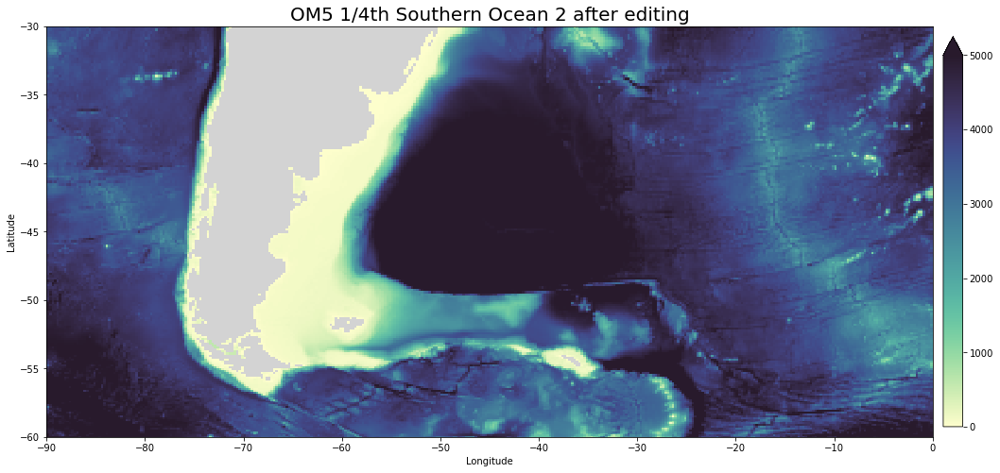

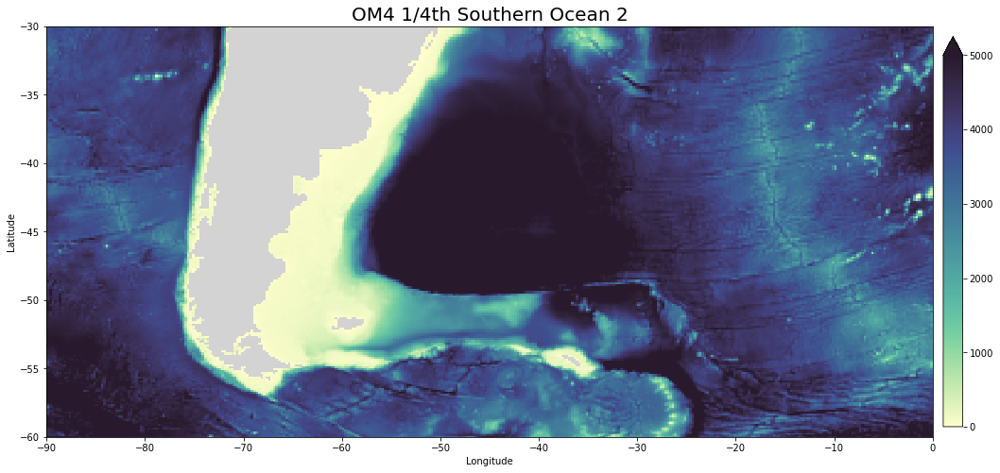

In [28]:
# Broad view of region after edits 

broadview(OM4,OM5,(-90,0), (-60,-30), 0, 5000, "Southern Ocean 2", om4=True, new=True)

In [29]:
OM5.write_nc("om5_topo_edits_region_06.nc")

New Depth at jEdit=327 iEdit=912 set to 200.0
New Depth at jEdit=327 iEdit=913 set to 400.0
New Depth at jEdit=327 iEdit=914 set to 500.0
New Depth at jEdit=327 iEdit=915 set to 500.0
New Depth at jEdit=327 iEdit=916 set to 500.0
New Depth at jEdit=328 iEdit=911 set to 350.0
New Depth at jEdit=328 iEdit=912 set to 200.0
New Depth at jEdit=328 iEdit=916 set to 500.0
New Depth at jEdit=329 iEdit=909 set to 250.0
New Depth at jEdit=329 iEdit=910 set to 100.0
New Depth at jEdit=329 iEdit=911 set to 100.0
New Depth at jEdit=330 iEdit=908 set to 600.0
New Depth at jEdit=330 iEdit=909 set to 600.0
New Depth at jEdit=331 iEdit=907 set to 600.0
New Depth at jEdit=331 iEdit=908 set to 600.0
New Depth at jEdit=332 iEdit=906 set to 600.0
New Depth at jEdit=332 iEdit=907 set to 600.0
New Depth at jEdit=333 iEdit=906 set to 600.0
New Depth at jEdit=334 iEdit=917 set to 50.0
New Depth at jEdit=334 iEdit=918 set to 50.0
New Depth at jEdit=335 iEdit=918 set to 70.0
New Depth at jEdit=335 iEdit=919 set 